In [1]:
import os
import numpy as np
import netCDF4 as nc4
import shutil
import warnings
warnings.filterwarnings('ignore')
import xarray as xr
from matplotlib import pyplot as plt
from sklearn.metrics import r2_score
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

import jupyter_book as jb
import statsmodels.api as sm
from scipy import stats

### 1. Set control variables

In [2]:
doanalysis = 1
paramfileroot='/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/nocomp_parameter_modification_python/paramfiles/NOCOMP_LHC/'
conv = 3600*24*365 
#where are we now?
read_params = 1
ncls_pft=3
vars_bm=['CUE','LAI','GPP']

ensN=10
if ensN == 1:
    ens_directory='FATES_NOCOMP_FBG_PPE_LHC1'
    ncases=100
    ychoose =30
    pfileroot = paramfileroot+'nocomp_lhc_v1_'

if ensN == 2:
    ens_directory='FATES_NOCOMP_FBG_PPE_LHC2'
    ncases=99
    ychoose =20
    pfileroot = paramfileroot+'nocomp_lhc_v2_'
    
if ensN == 3:
    ens_directory='FATES_NOCOMP_FBG_PPE_LHC3_'
    ncases=49
    ychoose =10
    pfileroot = paramfileroot+'nocomp_lhc_v3_'

if ensN == 4:
    ens_directory='FATES_NOCOMP_FBG_PPE_LHC4_'
    ncases=49
    ychoose =30
    pfileroot = paramfileroot+'nocomp_lhc_v4_'


if ensN == 5:
    ens_directory = 'FATES_NOCOMP_FBG_PPE_LHC5_'
    ncases = 300
    ychoose = 30
    pfileroot = paramfileroot+'nocomp_lhc_v5_'
    read_model_output= 1
    read_params = 0
    make_emulator = 1
    ncls_param=4

if ensN == 6:
    ens_directory='FATES_NOCOMP_FBG_PPE_LHC6_'
    ncases=500
    ychoose =30
    pfileroot = paramfileroot+'nocomp_lhc_v6_'
    read_model_output=1
    
if ensN == 7:
    ncases=50
    ychoose =2
    read_model_output=1

if ensN == 8:
    ncases=500
    ychoose =29
    read_model_output=1
    ncls_param=5


if ensN == 9:
    ncases=150
    ychoose =29
    read_model_output=1

if ensN == 10:
    ncases=500
    ychoose =29
    read_model_output=0
    ncls_param=4
    read_params = 0

if ensN == 11:
    ncases=9
    ychoose =29
    read_model_output=1
    ncls_param=4
    read_params = 1
    ens_directory='FATES_NOCOMP_FBG_PPE_LHC10_TEST_'
    pfileroot = 'parameter_outputs//params_output_10_'

if ensN == 12:
    ncases=9
    ychoose =29
    read_model_output=1
    ncls_param=4
    read_params = 1
    make_params=0
    ens_directory='FATES_NOCOMP_FBG_PPE_LHC12_TEST_'
    pfileroot = 'parameter_outputs//params_output_v1_10_'

if ensN == 13:
    ncases=100
    ychoose =29
    read_model_output=1
    ncls_param=4
    read_params = 1
    make_params=0
 


### Generic paths

In [3]:
if ensN != 11 and ensN != 12 :
    ens_directory='FATES_NOCOMP_FBG_PPE_LHC'+str(ensN)+'_'
    pfileroot = paramfileroot+'nocomp_lhc_v'+str(ensN)+'_'


pdatafile='parameter_outputs/params_v'+str(ensN)+'.nc'
ldatafile='lai_output_'+str(ensN)+'.nc'
nppdatafile='npp_output_'+str(ensN)+'.nc'
cuedatafile='cue_output_'+str(ensN)+'.nc'
gppdatafile='gpp_output_'+str(ensN)+'.nc'

vs=range(1,ncases+1) 
figdir = 'figs_ensN_'+str(ensN)

fatesvar='FATES_LAI'
yl=6

USER='rfisher'

#path to scratch (or where the model is built.)
output_dir='/glade/derecho/scratch/'+USER+'/'

caseroot=ens_directory

sgpath='sgmap.nc'

print(ensN, ens_directory)
print(pdatafile)


yr='.clm2.h0.'   

10 FATES_NOCOMP_FBG_PPE_LHC10_
parameter_outputs/params_v10.nc


In [4]:
def make_directory(fileroot):   
    if(os.path.isdir(fileroot)):
        print('dir exists:'+fileroot)
    else:
        os.mkdir(fileroot)
        print('made: '+fileroot)

In [5]:
make_directory(figdir)

dir exists:figs_ensN_10


### ANALYSIS: Choose variables to read in

In [6]:

vars=['FATES_GPP','FATES_NPP','FATES_LAI','FATES_NOCOMP_PATCHAREA_PF']
#,'QFLX_EVAP_TOT','FATES_GROWTH_RESP','FATES_LAI_CANOPY_SZ',
 #     'FATES_AREA_PLANTS','FATES_AREA_TREES','FATES_CANOPY_VEGC','FATES_USTORY_VEGC','FATES_TRIMMING','FATES_MAINT_RESP','FATES_LEAFMAINTAR','FATES_VEGC','FATES_VEGC_ABOVEGROUND','FATES_NPLANT_PF','FATES_TRIMMING','lat','lon','time']
 #### ANALYSIS: Make output figure directory
figdir = (os.getcwd() +'/'+ 'figs_'+ens_directory+'/')
make_directory(figdir)

dir exists:/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_/


###  2. Make a single data structure for the ensemble

In [7]:
print(read_model_output)
if read_model_output==1:
    print(output_dir,ncases+1)
    caseroot=ens_directory
    vs=range(ncases)
    if doanalysis ==1:
        debug=0
        firstgo=1
        mins_ds=[]
        maxs_ds=[]
        count=1
        missing=range(0,ncases+1)
        missing=np.multiply(missing,0)
        for i in range(1,ncases+1):
            print(i)
            run=caseroot+str(i)
            if(ychoose<10):
                hstring='.clm2.h0.000'
            elif (ychoose<100):
                hstring='.clm2.h0.00'
            else:
                hstring='.clm2.h0.0' 
            #os.listdir(output_dir + '/archive')
            ahpath = output_dir + 'archive/' + run + '/lnd/hist/' 
            rhpath = output_dir + run + '/run/' 
            
            tfile = run+hstring+str(ychoose)+'-02-01-00000.nc'
            missing[i]=1
            #if(os.path.isdir(hpath)): ! #there is an archive
            if(os.path.isfile(rhpath+tfile)):  # this years is in the archive. 
                hpath = rhpath
                if debug == 1 :print('file in archive',rhpath)
                missing[i]=0
            else:
                if debug == 1 :print('file not in archive. try rundir')                
                hpath = ahpath       
                if(os.path.isdir(hpath)): 
                    #print('there is a rundir',hpath+tfile)                
                    if(os.path.isfile(hpath+tfile)):
                        if debug == 1 :print('file in  rundir')
                        missing[i]=0
                    else:
                        print('no file in rundir',hpath+tfile)
                else:
                    print('there is no  rundir',hpath+tfile)
                    
            if(missing[i]==0): # the year can be found. 
                rt=hpath+run+yr+str(ychoose)+'*'
                rt=hpath+tfile
                if(firstgo==1):
                    tmp = xr.open_mfdataset(rt, decode_times=False)  
                    allvars=list(xr.open_dataset(hpath+tfile, decode_times=False).variables)
                    dropvars=list(set(allvars) - set(vars)) 
                    firstgo=0
                #print('rt',rt)
                tmp=xr.open_mfdataset(rt, decode_times=False, drop_variables=dropvars)
            else:
                print('MISSING INPUT')
              
            if i==1:
                try: 
                    del dsc
                except:
                    print('no dsc')
                dsc = tmp.load()           
            else:
                dsc=xr.concat([dsc,tmp],'ens')
    
    print('end')
else:
    print('not reading model output')

0
not reading model output


### 3 Read parameter files into a list. 

In [8]:
if(read_params==1):
    vsp=range(1,ncases+1) 
    print(pfileroot)
    paramsp=['not found'] * 100
    if doanalysis ==1:
        # loop round whole ensemble
        for i in vsp: 
            pfile1= xr.open_dataset(pfileroot+str(i)+'.nc')  
            if i==vsp[0]:
                try: 
                    del dsc_params
                except:
                    print('no dsc')
                all_param_data = pfile1                      
            else:
                all_param_data=xr.concat([all_param_data, pfile1], "ens")  
                 # Close the file
            pfile1.close()
else:
    print('readging existing param file: ',pdatafile)
    all_param_data= xr.open_dataset(pdatafile) 
    

#### Write parameter output file

if(read_params==1):
    try:
        os.remove(pdatafile)
    except:
        print('no pfile')
        
    all_param_data.to_netcdf(pdatafile)  
 

readging existing param file:  parameter_outputs/params_v10.nc


#### 4. Find modified parameters

In [9]:
directory_path = pfileroot
data1= xr.open_dataset(pfileroot+str(1)+'.nc') 
data2= xr.open_dataset(pfileroot+str(2)+'.nc') 
common_variables = set(data1.variables) & set(data2.variables)

# Iterate through the common variables and compare their values
parlist=[]
for var_name in common_variables:
    var_data1 = data1[var_name]
    var_data2 = data2[var_name]
    # Compare the values of the variables
    if not var_data1.equals(var_data2):
        parlist.append(var_name)

lhc_vars=parlist

if(ensN==8):
    lhc_vars=['fates_mort_hf_sm_threshold',
     'fates_phen_gddthresh_b', 'fates_mort_scalar_cstarvation', 
    'fates_grperc', 'fates_leaf_slamax', 'fates_phen_cold_size_threshold',
    'fates_phen_drought_threshold','fates_allom_d2ca_coefficient_min',
    'fates_rad_leaf_clumping_index',  'fates_leaf_slatop', 
    'fates_mort_scalar_coldstress','fates_allom_d2bl1',
    'fates_allom_d2ca_coefficient_max', 'fates_maintresp_leaf_vert_scaler_coeff2', 
    'fates_mort_scalar_hydrfailure', 'fates_mort_freezetol', 'fates_phen_mindayson',   
    'fates_leafn_vert_scaler_coeff2', 'fates_allom_fnrt_prof_b', 
    'fates_allom_d2bl2', 'fates_stoich_nitr', 'fates_maintresp_leaf_vert_scaler_coeff1', 'fates_phen_coldtemp',
    'fates_turnover_leaf', 'fates_recruit_seed_supplement', 'fates_q10_mr', 'fates_turnover_fnrt']
    parlist=lhc_vars
print(lhc_vars)
print(len(parlist))

#if ensN == 10: 
   # lhc_vars.remove("fates_q10_mr")    
   # lhc_vars.remove("fates_phen_gddthresh_b")  
    
print(len(lhc_vars))
lhc_vars_title=np.copy(lhc_vars)
for i, var in enumerate(lhc_vars):
    
    original_string =var
    substring_to_remove = "fates_"
    lhc_vars_title[i] = var.replace(substring_to_remove, "")



['fates_grperc', 'fates_stoich_nitr', 'fates_recruit_seed_supplement', 'fates_leaf_slatop', 'fates_q10_mr', 'fates_allom_d2ca_coefficient_min', 'fates_maintresp_leaf_vert_scaler_coeff2', 'fates_phen_gddthresh_b', 'fates_allom_d2ca_coefficient_max', 'fates_turnover_leaf']
10
10


### 5. Find parameter ranges

In [10]:

ensn=all_param_data.dims['ens']
x_array = np.zeros((ensn,len(parlist)))
plhc=all_param_data[parlist]
for i, var in enumerate(parlist):
    nd=all_param_data[var].ndim
    dnames=all_param_data[var].dims

    if(nd==1):
        param_mean=all_param_data[var] 
    elif nd==2:
        param_mean=all_param_data[var].mean('fates_pft')
    elif nd==3:
        param_mean=all_param_data[var].mean('fates_pft') 
        param_mean=param_mean.mean(dnames[1])
    x_array[:, i] = param_mean
    print('i=',i,var,x_array[1:4,i])

i= 0 fates_grperc [0.12256 0.12352 0.1096 ]
i= 1 fates_stoich_nitr [0.02086654 0.02041091 0.01177375]
i= 2 fates_recruit_seed_supplement [0.008 0.288 0.036]
i= 3 fates_leaf_slatop [0.02655627 0.02522347 0.01894027]
i= 4 fates_q10_mr [1.7862 1.5612 1.5576]
i= 5 fates_allom_d2ca_coefficient_min [0.53735252 0.34394372 0.2839203 ]
i= 6 fates_maintresp_leaf_vert_scaler_coeff2 [0.734832 1.551312 1.279152]
i= 7 fates_phen_gddthresh_b [712.1356 780.1464 732.0412]
i= 8 fates_allom_d2ca_coefficient_max [0.63691518 0.5275868  0.67907448]
i= 9 fates_turnover_leaf [1.00995833 0.89605667 1.32412667]


### 6 write LAI output file

In [11]:
if(read_model_output==1):
    try:
        os.remove(ldatafile)
    except:
        print('no lfile')
if(read_model_output==1):
    nppmatrix=(dsc['FATES_NPP'].mean('time') )
    nppmatrix.to_netcdf(nppdatafile)
### calculate and write CUE
if(read_model_output==1):
    npp=dsc.FATES_NPP    
    cue = npp.copy(deep=True) 
    cue=cue.mean(dim='time')
    cue=np.divide(cue,dsc.FATES_GPP.mean(dim='time'))
    cue.to_netcdf(cuedatafile)
if(read_model_output==1):
    print(ldatafile)
    laimatrix=(dsc['FATES_LAI'].mean('time') )
    laimatrix.to_netcdf(ldatafile)  
if(read_model_output==1):
    print(ldatafile)
    gppmatrix=(dsc['FATES_GPP'].mean('time') )
    gppmatrix.to_netcdf(gppdatafile)  
l=xr.open_dataset(ldatafile)
n=xr.open_dataset(nppdatafile)
c=xr.open_dataset(cuedatafile)
gpp_in=xr.open_dataset(gppdatafile)
gpp_in=np.multiply(gpp_in,conv)

### 7 Read in Adrianna's ILAMB data file

[[ 2.97680182e-01  1.00000000e+00 -5.58947372e+01 -6.75000000e+01]
 [ 8.33045592e-01  2.00000000e+00 -5.40000000e+01 -7.25000000e+01]
 [            nan  3.00000000e+00 -5.21052628e+01 -5.75000000e+01]
 ...
 [ 0.00000000e+00  3.98000000e+02  8.24210510e+01 -5.25000000e+01]
 [ 0.00000000e+00  3.99000000e+02  8.24210510e+01 -3.50000000e+01]
 [ 0.00000000e+00  4.00000000e+02  8.24210510e+01 -2.00000000e+01]]


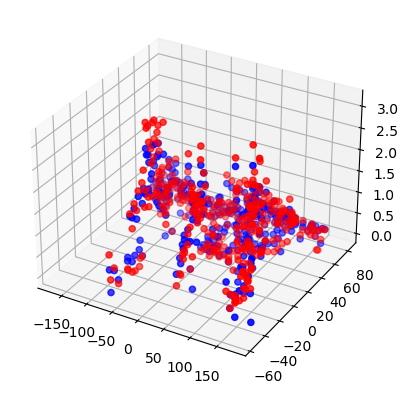

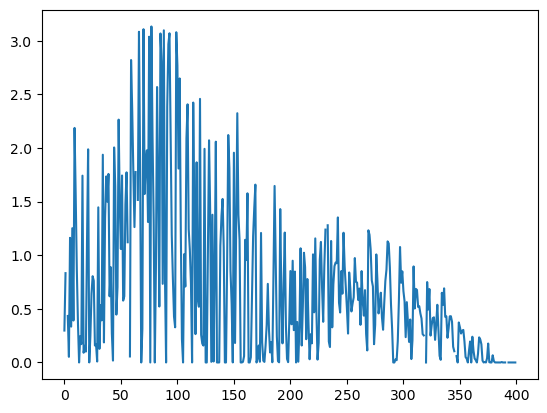

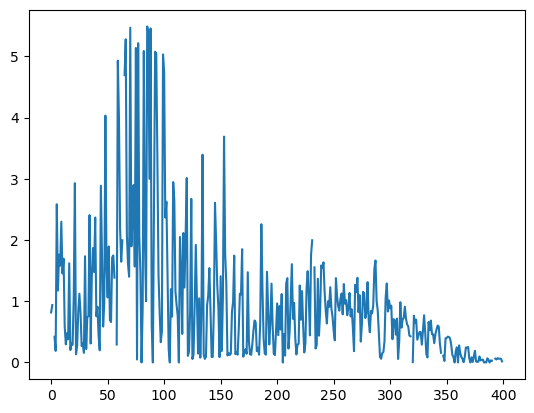

In [12]:
import pandas as pd

ilamb_file='ILAMB_sparsegrid_data.csv'

ilamb_data = pd.read_csv(ilamb_file)
lat_lon_array = ilamb_data[['lat', 'lon']].values

lai_values = ilamb_data.loc[ilamb_data['variable'] == 'lai']


lai_values = ilamb_data.loc[ilamb_data['variable'] == 'lai']
lai_values_modis = ilamb_data.loc[ilamb_data['model'] == 'MODIS']
glat=lai_values_modis['lat'].values
glon=lai_values_modis['lon'].values

lai_data_modis = lai_values_modis.loc[:, ['value', 'gridcell','lat','lon']]
lai_data_modis_sorted = lai_data_modis.sort_values(by='gridcell')
lai_data_modis_array = lai_data_modis_sorted.to_numpy()

lai_values_avhrr = ilamb_data.loc[ilamb_data['model'] == 'AVH15C1']
lai_data_avhrr = lai_values_avhrr.loc[:, ['value', 'gridcell','lat','lon']]
lai_values_avhrr = lai_values_avhrr.loc[:, ['value', 'gridcell','lat','lon']]

lai_data_avhrr = lai_values_avhrr.loc[:, ['value', 'gridcell','lat','lon']]
lai_data_avhrr_sorted = lai_data_avhrr.sort_values(by='gridcell')
lai_data_avhrr_array = lai_data_avhrr_sorted.to_numpy()

values_gbaf = ilamb_data.loc[ilamb_data['model'] == 'GBAF']
gpp_values_gbaf = values_gbaf.loc[values_gbaf['variable'] == 'gpp']
gpp_data_gbaf = gpp_values_gbaf.loc[:, ['value', 'gridcell','lat','lon']]
gpp_data_gbaf_sorted = gpp_data_gbaf.sort_values(by='gridcell')
gpp_data_gbaf_array = gpp_data_gbaf_sorted.to_numpy()

values_wecann = ilamb_data.loc[ilamb_data['model'] == 'WECANN']
gpp_values_wecann = values_wecann.loc[values_wecann['variable'] == 'gpp']
gpp_data_wecann = gpp_values_wecann.loc[:, ['value', 'gridcell','lat','lon']]
gpp_data_wecann_sorted = gpp_data_wecann.sort_values(by='gridcell')
gpp_data_wecann_array = gpp_data_wecann_sorted.to_numpy()


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(gpp_data_gbaf_array[:,3],gpp_data_gbaf_array[:,2],gpp_data_gbaf_array[:,0],color='red')
ax.scatter(gpp_data_wecann_array[:,3],gpp_data_wecann_array[:,2],gpp_data_wecann_array[:,0],color='blue')

print(gpp_data_gbaf_array
     )
fig = plt.figure()
plt.plot(gpp_data_gbaf_array[:,0])

fig = plt.figure()
plt.plot(lai_data_avhrr_array[:,0])

### 8. Read in gridcells dominated by each PFT

[59, 66, 75, 82, 84, 86, 87, 88, 92, 93, 113, 123, 134]
[3.9783148  4.85256377 4.37602256 4.46207183 0.         4.71636288
 2.23690402 4.30946843 3.9978255  3.60916557 0.         0.
 3.63237013]
[3.9783148  4.85256377 4.37602256 4.46207183 4.71636288 2.23690402
 4.30946843 3.9978255  3.60916557 3.63237013]


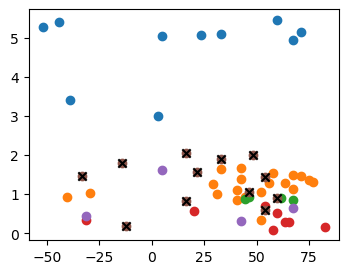

In [13]:
import pandas as pd
sg_pftmap_file='../sparse_grid_files/grid_pfts_dominant.csv'
sg_data = pd.read_csv(sg_pftmap_file)
pfts=[0, 1, 2, 9, 10, 11] #removed the two shrub PFTs 

gcells_pft=['.']*(max(pfts)+1)
for p in pfts: # pfts to select. 
    pftname=sg_data['pft'].values[p]
    gcl=sg_data['gridcells'].loc[sg_data['pft']== pftname].values[0]
    gc_list = gcl.split(',')
    gcells = [int(num) for num in gc_list]
    gcells_pft[p]=gcells
# remove the TBEF gridcells with zero LAI. These are not relevant to the fitting process. 
print(gcells_pft[0])
betlai=lai_data_modis_array[gcells_pft[0],0]
print(betlai)
gcells_pft[0].pop(4)
gcells_pft[0].pop(10)
gcells_pft[0].pop(9)
betlai=lai_data_modis_array[gcells_pft[0],0]
print(betlai)
fig, axes = plt.subplots(figsize=(4, 3))
for p in pfts:
    plt.scatter(glat[gcells_pft[p]],lai_data_avhrr_array[gcells_pft[p],0])
plt.scatter(glat[gcells],lai_data_avhrr_array[gcells,0],color='black',marker='x')

### 9. Plot out the ensemble space of all gridcells wrt LAI data

plot_range=0

if(plot_range==1):    
    laiens=l.FATES_LAI
    laiens_s = np.swapaxes(laiens, 0, 1)
    #laiens_t = np.transpose(laiens)
    fig, axes = plt.subplots(nrows=7, ncols=1, figsize=(27, 16))
    plt.subplots_adjust(wspace=0.1, hspace=0.15)
    
    for r in range(0,8):   
       # axes[r, 0].set_title(var,fontsize=20)   
        for e in range(len(laiens)):   
            axes[r-1].scatter(lai_data_modis_array[(r-1)*50:r*50,1],laiens_s[(r-1)*50:r*50,e],color='grey',s=8)
        axes[r-1].scatter(lai_data_modis_array[(r-1)*50:r*50,1], lai_data_avhrr_array[(r-1)*50:r*50,0],color='blue',s=100,marker='x')        
        axes[r-1].scatter(lai_data_modis_array[(r-1)*50:r*50,1], lai_data_modis_array[(r-1)*50:r*50,0],color='red',s=100,marker='x')        
        axes[r-1].set_ylabel('LAI', fontsize=18) 
        axes[r-1].set_ylim([0,6]) 
    axes[r-1].set_xlabel('Gridcell', fontsize=20) 
    plt.savefig(figdir+'/range_vs_data_'+fatesvar+'_y'+str(ychoose)+'Nens_'+str(ensN)+'.png',bbox_inches='tight')  
    plt.show()

### 10.1 Plot the LAI ensemble space per PFT

3

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



0
1
2
9
10
11


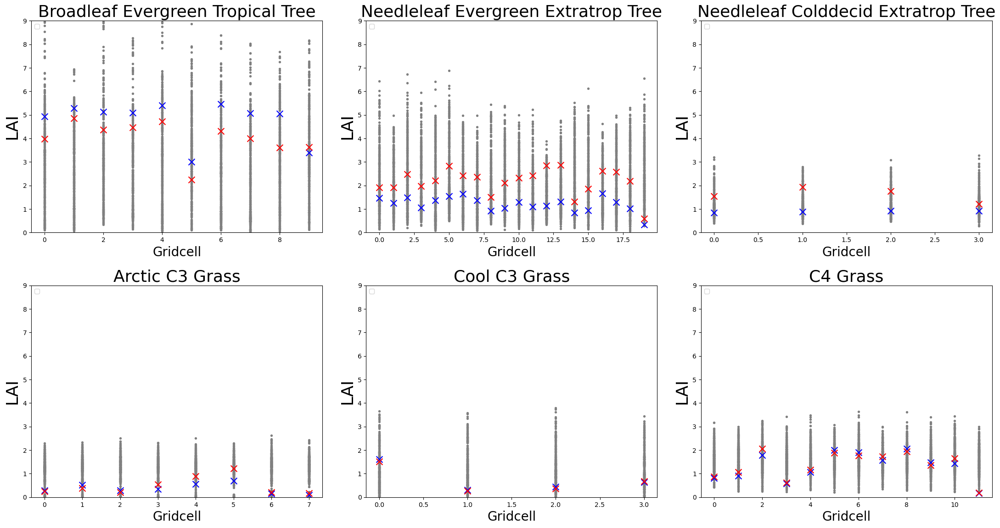

/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//range_vs_data_laiFATES_LAI_y29Nens_10.png
[0.44 0.45 0.44 0.   0.   0.   0.   0.   0.   0.46 0.46 0.46]


In [14]:
plot_range=1
ncls=ncls_pft
rw=int(len(pfts)/ncls)+1
print(rw)
lai_pft_mean1=np.zeros([max(pfts)+1,ncases])
if(plot_range==1): 
    fig, axes = plt.subplots(nrows=rw, ncols=ncls, figsize=(27, 21))
    plt.subplots_adjust(wspace=0.15, hspace=0.25)

    laiens=l.FATES_LAI
    laiens_s = np.swapaxes(laiens, 0, 1)
    axcount=0
    for p in pfts: # pfts to select. 
        gcells=gcells_pft[p]
        print(p)

        xvar = [list(range(len(gcells))) for _ in range(len(laiens))]
        if len(gcells) >0 :
            row = axcount //ncls
            col = axcount % ncls   
            axcount=axcount+1
            laiens=l.FATES_LAI
            lai_pft_mean1[p,:]=np.mean(laiens_s[gcells,:],0)
           # axes[r, 0].set_title(var,fontsize=20)   
            lai_data_modis_array[gcells,0]   
            if np.shape(laiens_s)[1] <20:
                for e in range(ncases): 
                    axes[row,col].scatter(range(len(gcells)),laiens_s[gcells,e],color=plt.cm.tab10(e),s=18,label='ens #'+str(e))
            else:
                axes[row,col].scatter(xvar,laiens_s[gcells,:],color='grey',s=8)

            axes[row,col].scatter(range(len(gcells)), lai_data_avhrr_array[gcells,0],color='blue',s=100,marker='x')        
            axes[row,col].scatter(range(len(gcells)), lai_data_modis_array[gcells,0],color='red',s=100,marker='x')        
            axes[row,col].set_ylabel('LAI', fontsize=26) 
            axes[row,col].set_ylim([0,9]) 
            axes[row,col].set_title(sg_data['pft'].values[p].title(), fontsize=26) 
            axes[row,col].set_xlabel('Gridcell', fontsize=20)
            axes[row,col].legend(loc='upper left')
    while axcount < rw*ncls:
        row = axcount //ncls
        col = axcount %ncls
        axes[row, col].remove()
        axcount += 1
    figname=figdir+'/range_vs_data_lai'+fatesvar+'_y'+str(ychoose)+'Nens_'+str(ensN)+'.png'
    plt.savefig(figname,bbox_inches='tight')  
    plt.show()
    print(figname)

### Find mean CUE per PFT
cue_pft_mean=np.zeros(max(pfts)+1)
cue_pft_std=np.zeros(max(pfts)+1)
for p in pfts: # pfts to select. 
    gcells=gcells_pft[p]
    cue_pft_mean[p]=0.46
    cue_pft_std[p]=0.11

cue_pft_mean[0]=0.44
cue_pft_mean[1]=0.45
cue_pft_mean[2]=0.44

print(cue_pft_mean)
# EBT 0.44 ± 0.11
# DBT 0.50 ± 0.13    
# ENT 0.45 ± 0.11

### Plot the CUE ensemble per PFT

3


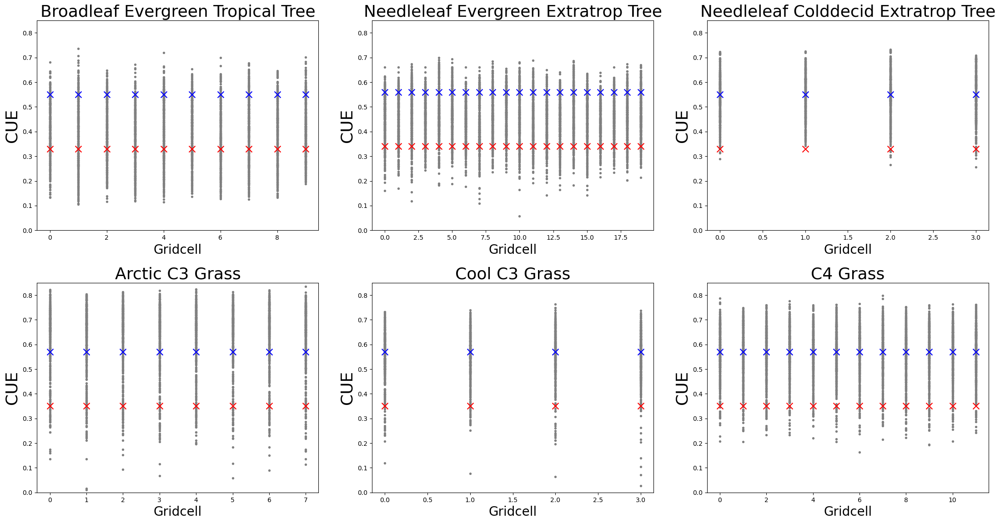

In [16]:

plot_range=1
ncls=ncls_pft
rw=int(len(pfts)/ncls)+1
print(rw)


if(plot_range==1): 
    fig, axes = plt.subplots(nrows=rw, ncols=ncls, figsize=(27, 21))
    plt.subplots_adjust(wspace=0.19, hspace=0.25)

    cueens=c.FATES_NPP
    cueens_s = np.swapaxes(cueens, 0, 1)
    axcount=0
    for p in pfts: # pfts to select. 
       
        gcells=gcells_pft[p]
        if len(gcells) >0 :
            xvar = [list(range(len(gcells))) for _ in range(len(laiens))]
            row = axcount //ncls
            col = axcount % ncls   
            axcount=axcount+1
            #laiens_t = np.transpose(laiens)
           # axes[r, 0].set_title(var,fontsize=20)   
            lai_data_modis_array[gcells,0]
            cuemin=cue_pft_mean[p]-cue_pft_std[p]
            cuemax=cue_pft_mean[p]+cue_pft_std[p]  
            axes[row,col].scatter(xvar,cueens_s[gcells,:],color='grey',s=8)
            axes[row,col].scatter(range(len(gcells)), lai_data_avhrr_array[gcells,0]*0+cuemin,color='red',s=100,marker='x')        
            axes[row,col].scatter(range(len(gcells)), lai_data_avhrr_array[gcells,0]*0+cuemax,color='blue',s=100,marker='x')        
            axes[row,col].set_ylabel('CUE', fontsize=26) 
            axes[row,col].set_ylim([0,0.85]) 
            axes[row,col].set_title(sg_data['pft'].values[p].title(), fontsize=26) 
            axes[row,col].set_xlabel('Gridcell', fontsize=20)
    while axcount < rw*ncls:
        row = axcount //ncls
        col = axcount %ncls
        axes[row, col].remove()
        axcount += 1
    plt.savefig(figdir+'/range_vs_data_cue_'+fatesvar+'_y'+str(ychoose)+'Nens_'+str(ensN)+'.png',bbox_inches='tight')  
    plt.show()

### Plot the GPP space per PFT

rows 3
gpp1 (500, 400) 4.035308240645463
gpp2 (400, 500)
0
1
2
9
10
11
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//range_vs_data_gpp_FATES_LAI_y29Nens_10.png


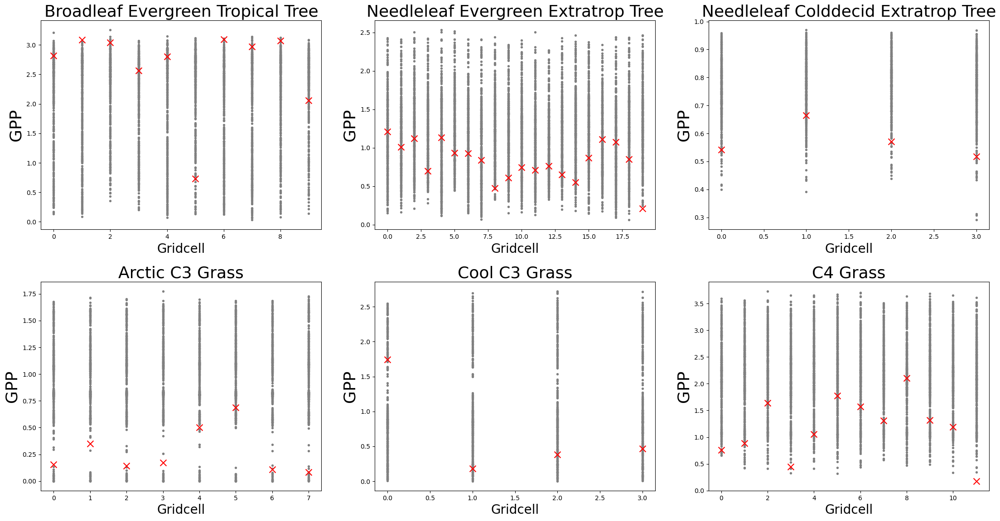

In [17]:

plot_range=1
ncls=ncls_pft
rw=int(len(pfts)/ncls)+1
print('rows',rw)

if(plot_range==1): 
    fig, axes = plt.subplots(nrows=rw, ncols=ncls, figsize=(27, 21))
    plt.subplots_adjust(wspace=0.19, hspace=0.25)
    gppens=gpp_in.FATES_GPP
    print('gpp1',gppens.shape,np.max(gppens).values)
    gppens_s = np.swapaxes(gppens, 0, 1)
    print('gpp2',gppens_s.shape)
    axcount=0
    for p in pfts: # pfts to select. 
        print(p)
        gcells=gcells_pft[p]
        if len(gcells) >0 :
            xvar = [list(range(len(gcells))) for _ in range(len(laiens))]
            row = axcount //ncls
            col = axcount % ncls   
            axcount=axcount+1

            #laiens_t = np.transpose(laiens)
           # axes[r, 0].set_title(var,fontsize=20)   
            
            #cuemin=cue_pft_mean[p]-cue_pft_std[p]
            #cuemax=cue_pft_mean[p]+cue_pft_std[p]  
            axes[row,col].scatter(xvar,gppens_s[gcells,:],color='grey',s=8)

            #axes[row,col].scatter(xvar,gppens_s[gcells,common_values],color='cyan',s=14)
            axes[row,col].scatter(range(len(gcells)), lai_data_avhrr_array[gcells,0]*0+gpp_data_gbaf_array[gcells,0],color='red',s=100,marker='x')        
            #axes[row,col].scatter(range(len(gcells)), lai_data_avhrr_array[gcells,0]*0+cuemax,color='blue',s=100,marker='x')        
            axes[row,col].set_ylabel('GPP', fontsize=26) 
            #axes[row,col].set_ylim([0,0.85]) 
            axes[row,col].set_title(sg_data['pft'].values[p].title(), fontsize=26) 
            axes[row,col].set_xlabel('Gridcell', fontsize=20)
    while axcount < rw*ncls:
        row = axcount //ncls
        col = axcount %ncls
        axes[row, col].remove()
        axcount += 1
    figname = figdir+'/range_vs_data_gpp_'+fatesvar+'_y'+str(ychoose)+'Nens_'+str(ensN)+'.png'
    print(figname)
    plt.savefig(figname,bbox_inches='tight')  
    plt.show()

### Find mean LAI per PFT
modis_lai_pft=np.zeros(max(pfts)+1)
avhrr_lai_pft=np.zeros(max(pfts)+1) 
gbaf_gpp_pft=np.zeros(max(pfts)+1)
wecann_gpp_pft=np.zeros(max(pfts)+1)
for p in pfts: # pfts to select. 
    gcells=gcells_pft[p]
    modis_lai_pft[p]=np.mean(lai_data_modis_array[gcells,0])
    avhrr_lai_pft[p]=np.mean(lai_data_avhrr_array[gcells,0])
    gbaf_gpp_pft[p] =np.mean(gpp_data_gbaf_array[gcells,0])
    wecann_gpp_pft[p] =np.mean(gpp_data_wecann_array[gcells,0])

### 10 Deal with any nans in the model output

nan_indices = l.FATES_LAI.isnull().any(dim='ens')

# Use the where method to filter out NaN values along the 'time' dimension
filtered_data = l.FATES_LAI.where(~nan_indices, drop=True)
lnonan=filtered_data.fillna(999)
lnonan=l.FATES_LAI

nan_indices = c.FATES_NPP.isnull().any(dim='ens')
# Use the where method to filter out NaN values along the 'time' dimension
filtered_data = c.FATES_NPP.where(~nan_indices, drop=True)
cnonan=filtered_data.fillna(999)
cnonan=c.FATES_NPP

gnonan=gpp_in.FATES_GPP

In [18]:
### 11.  Make Function to map out parameter space
def map_param_space(g,vnonan):
    ncls=ncls_param
    rw=int(len(lhc_vars)/ncls)+1

    fig, axes = plt.subplots(nrows=rw, ncols=ncls, figsize=(27, 16))
    plt.subplots_adjust(wspace=0.1, hspace=0.15)
    fig.suptitle('Impacts of parameter variation on ' + fatesvar,y=0.93, fontsize=26)
    p=-1
    axcount=0
    timemean=dsc[fatesvar].mean('time')
  
    X=x_array 
    yall=vnonan[:,g]
    yall=yall[0:len(x_array)]   
    
    print(yall.shape,np.shape(x_array))
    
    for i, var in enumerate(parlist):
        p=p+1
     #   print(p)
        row = axcount //ncls
        col = axcount % ncls        
        axcount=axcount+1    
        #print(np.shape(paramv), fates_output_data.shape)
        axes[row, col].set_title(var,fontsize=20)    
        diffplot=axes[row, col].scatter(x_array[:,i],yall)
        if(row>1):
            axes[row, col].set_yticklabels([], fontsize=18) 
        if(col>1):
            axes[row, col].set_yticklabels([], fontsize=18) 
        #axes[row, col].set_ylim([0,yl]) 
    while axcount < rw*ncls:
        row = axcount //ncls
        col = axcount %ncls
        axes[row, col].remove()
        axcount += 1
    
    plt.savefig(figdir+'x_vs_y'+fatesvar+'_y'+str(ychoose)+'_g'+str(g)+'.png',bbox_inches='tight')  
    plt.show()
### 13. Make different types of statistical model  

### 13.1 Random forest

In [19]:

# Load a sample dataset (Boston housing dataset)
def random_forest(g,fgs,feat, axes, row, col,multp,vnonan):
    yall=vnonan[:,g]

    if np.ndim(yall)==2:     
        yall=np.mean(yall,1)
    nan_indices = yall.isnull()
    yall[np.isnan(yall)] = np.mean(yall)
    yall=yall[0:len(x_array)]
    X=x_array[0:len(yall),:]
    
    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X,yall, test_size=0.2, random_state=42)
    mask = np.where(np.isinf(y_train))
    y_train[mask]=0.5
    # Create a random forest regressor model
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    
    # Fit the model to the training data
    rf_model.fit(X_train, y_train)
    rf_models.append(rf_model)

    # Make predictions on the testing data
    y_pred = rf_model.predict(X_test)
    if(fgs==1 ):
        if(multp==1):
            ax=axes[row,col]
        else:
            ax=axes
       # map_param_space(g)
        #fig = plt.figure()
        ax.scatter(y_test,y_pred,color='blue',s=20,label='Random Forest')
        ax.plot([0,max(y_pred)],[0,max(y_pred)],color='black')
            #plt.scatter(tr_predictions,y)
        #axes[row,col].title('g='+str(g)+' Lat:'+str(round(glat[g], 2))+' Lon:'+str(round(glon[g], 2)))

        ax.set_xlabel(fatesvar+' process model')
        ax.set_ylabel(fatesvar+' surrogate')
    r_squared = stats.pearsonr(y_pred, y_test)[0] ** 2
    if(feat==1):
        feature_importances = rf_model.feature_importances_
    
    # Create a DataFrame to display the feature importances
        #feature_importances_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
        #feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)
        feature_importances_df = pd.DataFrame({'Feature Importance': feature_importances})
        feature_importances_df['FeatureIndex'] = range(0, len(feature_importances_df) )

        feature_importances_df = feature_importances_df.sort_values(by='Feature Importance', ascending=False)
    
        # Display the dominant factors
        #print(feature_importances_df.FeatureIndex.iloc[1:4])
        featimp=feature_importances_df.FeatureIndex.iloc[0:4]
    return r_squared,featimp

### 13.2 Linear Regression

In [20]:

def linear_regression(g,fgs, axes, row, col,vnonan):
    yall=vnonan[:,g]
    if np.ndim(yall)==2:   
        yall=np.mean(yall,1)
    nan_indices = yall.isnull()
    yall[np.isnan(yall)] = np.mean(yall)   
    X=x_array
    X_train, X_test, y_train, y_test = train_test_split(X,yall, test_size=0.2, random_state=42)
    
    model = sm.OLS(y_train, X_train).fit()  # Fit the multivariate linear regression model
   # print(model.summary())
    predictions = model.predict(X_test)
    tr_predictions = model.predict(X)
    if(fgs==1):
        #map_param_space(g)
        axes[row,col].scatter(y_test,predictions,color='green',label='Linear Regression')
        #plt.scatter(tr_predictions,y)
    residuals = model.resid

# Calculate the standard deviation of predictions
  #  std_dev_predictions = residuals.std()
  #  rel_dev=np.divide(std_dev_predictions,np.mean(y))

    r_squared = stats.pearsonr(predictions, y_test)[0] ** 2
    return r_squared
    

### 13.3 Gaussian Process emulator

In [21]:

def make_emulator_for_point(g,fgs, axes, row, col,vn):
    yall=vn[:,g]

    if np.ndim(yall)==2:     
        yall=np.mean(yall,1)
    nan_indices = yall.isnull()
    yall[np.isnan(yall)] = np.mean(yall)
    yall=yall[0:len(x_array)]
    X=x_array[0:len(yall),:]
    
    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X,yall, test_size=0.2, random_state=42)
    mask = np.where(np.isinf(y_train))
    y_train[mask]=0.5    
    kernel = 1 * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))
    gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
    y_pred =gp.fit(X_train, y_train)
    test_prediction, std_prediction = gp.predict(X_test, return_std=True)
    #r2 = r2_score(ytest, test_prediction) 
    
    if(np.max(test_prediction)==0):
        print('emulator fail')
    else:
        print('mean pred',np.mean(test_prediction))
    

    if(fgs==1 ):
        if(multp==1):
            ax=axes[row,col]
        else:
            ax=axes
            
        ax.scatter(y_test,test_prediction, color='red', marker='o',label='GP emulator')
        ax.legend(loc='upper left')
        #ax.scatter(test_prediction,ytest)
        #ax.set_xlabel('LAI emulator')
        #ax.set_ylabel('LAI FATES')

    r_squared = stats.pearsonr(test_prediction, y_test)[0] ** 2
    return r_squared
    

### 14.  Run emulators

p,v 0 0
mean pred 0.3803935303694845
p,v 1 0
mean pred 0.44846960596206054
p,v 2 0
mean pred 0.5390145180290395
p,v 9 0
mean pred 0.584673830711388
p,v 10 0
mean pred 0.5479912069550847
p,v 11 0
mean pred 0.5544284051438204


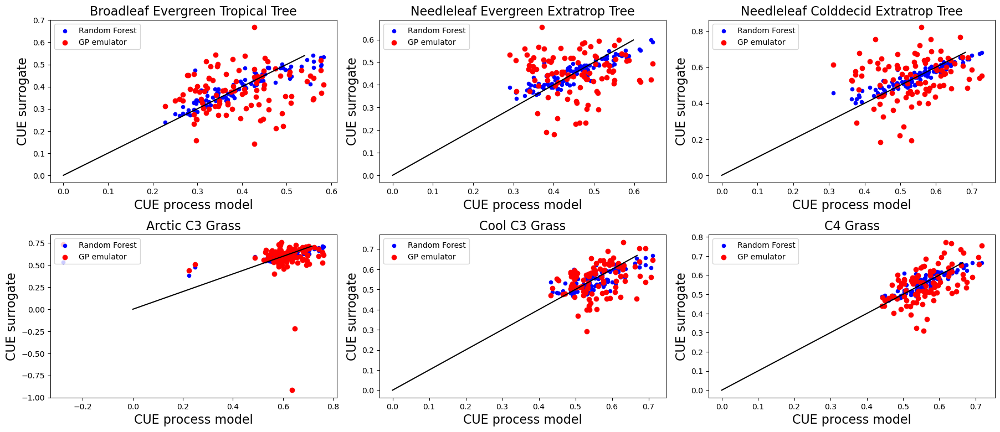

p,v 0 1
mean pred 2.21333220006554
p,v 1 1
mean pred 1.4972941395315091
p,v 2 1
mean pred 1.0236208728916498
p,v 9 1
mean pred 1.1847341059154055
p,v 10 1
mean pred 1.0872275659941868
p,v 11 1
mean pred 1.46834813558122


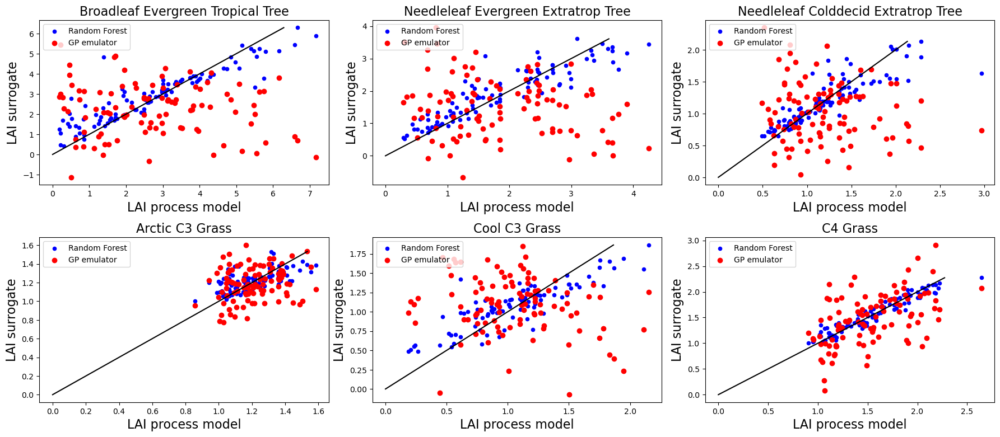

p,v 0 2
mean pred 1.9098404160065399
p,v 1 2
mean pred 1.0641992143023755
p,v 2 2
mean pred 0.7475080711493751
p,v 9 2
mean pred 0.9384367472523013
p,v 10 2
mean pred 0.9321677383103332
p,v 11 2
mean pred 2.0578653172749655


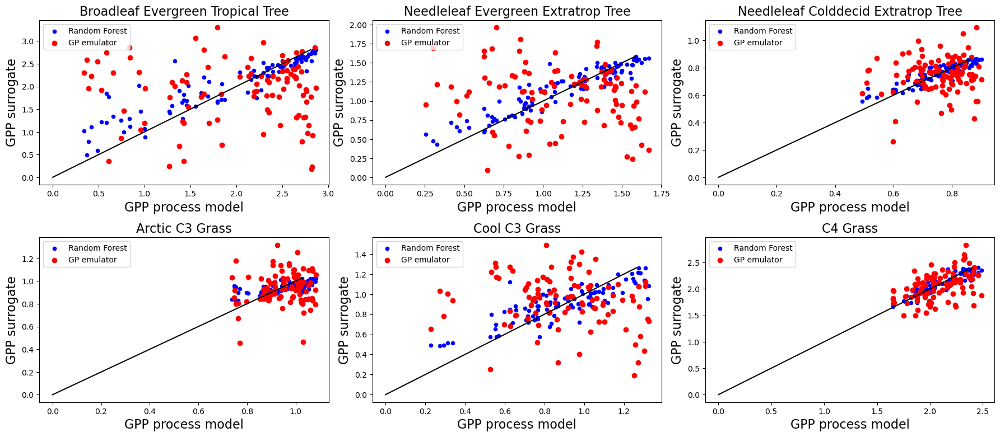

5


In [22]:
# Make empty lists for statistical models
rf_st=np.zeros(355)
lr_st=np.zeros(355)
gp_st=np.zeros(355)

ncls=ncls_pft
rw=int(len(gcells)/ncls)+1
feat_importance = np.zeros([len(pfts),4,3], dtype=int)
vnonan=[cnonan,lnonan,gnonan]
for v, vn in enumerate(vnonan): 
    fig, axes = plt.subplots(nrows=rw, ncols=ncls, figsize=(22, 24))
    plt.subplots_adjust(wspace=0.15, hspace=0.32)
    multp=1
    rf_models = []
    rf_st=np.zeros(max(pfts))
    axcount=0
    for i in range(len(pfts)):
        
        p=pfts[i]
        print('p,v',p,v)
        row = axcount //ncls
        col = axcount % ncls   
        axcount=axcount+1
        rf_st[i],feat_importance[i,:,v]=random_forest(gcells_pft[p],1,1, axes, row, col,multp,vn)
        make_emulator_for_point(gcells_pft[p],1, axes, row, col,vn)

        axes[row,col].set_xlabel(vars_bm[v]+' process model',fontsize=16)
        axes[row,col].set_ylabel(vars_bm[v]+' surrogate',fontsize=16)
        axes[row,col].set_title(sg_data['pft'].values[p].title(),fontsize=16)
    
    while axcount < rw*ncls:
        row = axcount //ncls
        col = axcount %ncls
        axes[row, col].remove()
        axcount += 1

    plt.savefig(figdir+'/PFT_level_RF_fit_'+vars_bm[v]+'_y'+str(ychoose)+'Nens_'+str(ensN)+'.png',bbox_inches='tight')  
    plt.show()
    if(v==0):        
        rf_models_cue = rf_models
    elif v==1:
        rf_models_lai = rf_models
    else:
        rf_models_gpp = rf_models
        
print(feat_importance[1,1,1])

### 14.3 Plot gridcell specific emulators (for a given PFT) in differenet subplots


In [23]:
plot_gcell_fit=0
target_pft=0
vnonan=cnonan
if plot_gcell_fit==1 :
    multp=0
    ncls=3
    rw=int(len(gcells)/ncls)+1
    print(rw)
    fig, axes = plt.subplots(nrows=rw, ncols=ncls, figsize=(27, 21))
    plt.subplots_adjust(wspace=0.1, hspace=0.15)
    
    do_all_models=1
    if(do_all_models==1):
        rf_models = []
        feat_importance = np.zeros([355,4,2], dtype=int)
        axcount=0
        for g in gcells:
            row = axcount //ncls
            col = axcount % ncls   
            axcount=axcount+1
            rf_st[g],feat_importance[g,:,v]=random_forest(g,1,1, axes, row, col,multp,vnonan)
            lr_st[g]=linear_regression(g,1, axes, row, col)
            gp_st[g]=make_emulator_for_point(g,1, axes, row, col)
            print('g='+str(g),'rf:',rf_st[g],'l1:',lr_st[g],'gp:',gp_st[g])
        plt.savefig(figdir+'/emulator_test_'+str(ensN)+'_'+fatesvar+'_p'+str(p)+'.png', bbox_inches='tight')
        plt.show()

    else:
        rf_models = []
        feat_importance = np.zeros([355,4], dtype=int)
        for g in gcells:
            rf_st[g],feat_importance[g,:]=random_forest(g,0,1)
            print(feat_importance[g,:],lhc_vars[feat_importance[g,0]],
                 lhc_vars[feat_importance[g,1]],
                 lhc_vars[feat_importance[g,2]])
    
### 15. Make a large hypercube encompassing the whole parameter space 
num_samples=150000
num_variables = len(lhc_vars)
hypercube = np.zeros((num_samples, num_variables))
for i in range(num_variables):
    hypercube[:, i] = np.random.permutation(np.linspace(0, 1, num_samples))

hypercube_scaled=np.zeros((num_samples, num_variables))
#for i  in range(5):
for i, var in enumerate(lhc_vars):
    mx=np.max(x_array[:,i])
    mn=np.min(x_array[:,i])
    print(var,mn,mx)
    for e in range(num_samples):
        hypercube_scaled[e,i]=(hypercube[e,i]*(mx-mn))+mn
Xdense=hypercube_scaled
print('hypercube shape',np.shape(Xdense))
### 16 Find simulations with acceptable LAI and CUE
y_pred_noise_i_lai = []
y_pred_noise_i_cue = []
y_pred_noise_i_gpp = []
for i in range(len(pfts)):
    g=gcells[i]     
    y_pred_noise_i_lai.append(rf_models_lai[i].predict(Xdense))
    y_pred_noise_i_cue.append(rf_models_cue[i].predict(Xdense))
    y_pred_noise_i_gpp.append(rf_models_gpp[i].predict(Xdense))

    print(i,'mean CUE',np.mean(y_pred_noise_i_cue[i]))
 

fates_grperc 0.07000000000000002 0.12999999999999998
fates_stoich_nitr 0.011555835083333335 0.021460836583333337
fates_recruit_seed_supplement 0.0 0.5
fates_leaf_slatop 0.015866666666666664 0.029466666666666665
fates_q10_mr 1.0499999999999998 1.9500000000000002
fates_allom_d2ca_coefficient_min 0.11909408666666664 0.5954704333333334
fates_maintresp_leaf_vert_scaler_coeff2 0.486 2.43
fates_phen_gddthresh_b 319.0 1148.4
fates_allom_d2ca_coefficient_max 0.4168293033333333 0.7741115633333333
fates_turnover_leaf 0.7283333333333334 1.3541666666666667
hypercube shape (150000, 10)
0 mean CUE 0.39091599534671906
1 mean CUE 0.4509091024981023
2 mean CUE 0.539257101548054
3 mean CUE 0.6088300948398482
4 mean CUE 0.547165583840525
5 mean CUE 0.5636531985371808


### Find acceptable models

In [30]:
   
def find_acceptable_models(rfm,p,pftfit,vartoggle,fates_ens,fates_or_surrogate):
    fates_ens_mean=fates_ens.mean('gridcell')
    fates_ens_mean.plot() 
    print('fatesens',np.shape(fates_ens),np.shape(fates_ens_mean),fates_ens.dims)
    if(vartoggle==1): 
        y_pred_noise=y_pred_noise_i_lai[rfm]
        if(pftfit==1):
            ldmin=min(modis_lai_pft[p],avhrr_lai_pft[p])
            ldmax=max(modis_lai_pft[p],avhrr_lai_pft[p])
            print('lai range',p,ldmin,ldmax)
        y_accept=np.where(np.logical_and(y_pred_noise>=ldmin, y_pred_noise<=ldmax))   
        y_accept_ens= np.where(np.logical_and(fates_ens_mean>=ldmin, fates_ens_mean<=ldmax))  
    elif vartoggle==2:
        y_pred_noise=y_pred_noise_i_cue[rfm]
        cdmin=cue_pft_mean[p]-0.5*cue_pft_std[p]
        cdmax=cue_pft_mean[p]+0.5*cue_pft_std[p]
        print('cue range',cdmin,cdmax)
        y_accept=np.where(np.logical_and(y_pred_noise>=cdmin, y_pred_noise<=cdmax))   
        y_accept_ens= np.where(np.logical_and(fates_ens_mean>=cdmin, fates_ens_mean<=cdmax))  
    elif vartoggle==3:
        y_pred_noise=y_pred_noise_i_gpp[rfm]
        gppmin=min(wecann_gpp_pft[p],gbaf_gpp_pft[p])
        gppmax=max(wecann_gpp_pft[p],gbaf_gpp_pft[p])
        print('gpprange',gppmin,gppmax)
        y_accept=np.where(np.logical_and(y_pred_noise>=gppmin, y_pred_noise<=gppmax))   
        y_accept_ens= np.where(np.logical_and(fates_ens_mean>=gppmin, fates_ens_mean<=gppmax))  

    if(fates_or_surrogate==0):
        return y_accept_ens
    else:
        return y_accept

pft 0
fatesens (500, 10) (500,) ('ens', 'gridcell')
lai range 0 4.017106948440324 4.778851745056542
fatesens (500, 10) (500,) ('ens', 'gridcell')
cue range 0.385 0.495
fatesens (500, 10) (500,) ('ens', 'gridcell')
gpprange 2.0454511111352396 2.624446254444618
fatesens (500, 10) (500,) ('ens', 'gridcell')
lai range 0 4.017106948440324 4.778851745056542
fatesens (500, 10) (500,) ('ens', 'gridcell')
cue range 0.385 0.495
fatesens (500, 10) (500,) ('ens', 'gridcell')
gpprange 2.0454511111352396 2.624446254444618
pft 1
fatesens (500, 20) (500,) ('ens', 'gridcell')
lai range 1 1.2033633652257067 2.1630972035964744
fatesens (500, 20) (500,) ('ens', 'gridcell')
cue range 0.395 0.505
fatesens (500, 20) (500,) ('ens', 'gridcell')
gpprange 0.5737515903334618 0.8238335765446184
fatesens (500, 20) (500,) ('ens', 'gridcell')
lai range 1 1.2033633652257067 2.1630972035964744
fatesens (500, 20) (500,) ('ens', 'gridcell')
cue range 0.395 0.505
fatesens (500, 20) (500,) ('ens', 'gridcell')
gpprange 0.57

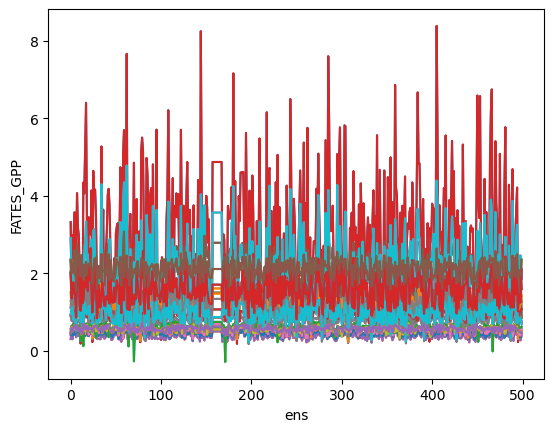

In [53]:
pftfit=1

accept_lai_i = []
accept_cue_i = []
accept_gpp_i = []
accept_both_i = []

accept_lai_ens_i = []
accept_cue_ens_i = []
accept_gpp_ens_i = []
accept_both_ens_i = []


if(pftfit==1):
    for rfm in range(len(pfts)):        
        p=pfts[rfm]   
        print('pft',p)
        
        accept_lai_i.append(find_acceptable_models(rfm,p,pftfit,1,lnonan[:,gcells_pft[p]],1))
        accept_cue_i.append(find_acceptable_models(rfm,p,pftfit,2,cnonan[:,gcells_pft[p]],1))
        accept_gpp_i.append(find_acceptable_models(rfm,p,pftfit,3,gnonan[:,gcells_pft[p]],1))

        accept_lai_ens_i.append(find_acceptable_models(rfm,p,pftfit,1,lnonan[:,gcells_pft[p]],0))
        accept_cue_ens_i.append(find_acceptable_models(rfm,p,pftfit,2,cnonan[:,gcells_pft[p]],0))
        accept_gpp_ens_i.append(find_acceptable_models(rfm,p,pftfit,3,gnonan[:,gcells_pft[p]],0))
        
else: # gridcell fit  
    for rfm in range(len(gcells)):
        g=gcells[i]        
        accept_lai_i.append(find_acceptable_models(rfm,g,pftfit))  
print(accept_lai_i[1][1:10])

### Draw selected parameter space

In [98]:
def draw_selected_param_space(rfm,p,pftfit,vtoggle):
    ncls=ncls_param
    if ncls==5: 
        tsz=16
        ysz=14
        xsz=14
        ht=16
        psz=9
    if ncls==4 :
        tsz=18
        ysz=18
        xsz=18
        ht=13
        psz=14
    #colors = plt.get_cmap('tab10').colors
    #colors = plt.get_cmap('CSS4_COLORS').colors

    # Choosing a specific color from the Tableau color palette
          
    axcount=0
    y_accept_lai=accept_lai_i[rfm]
    y_accept_cue=accept_cue_i[rfm]
    y_accept_gpp=accept_gpp_i[rfm]
    if(vtoggle==0):
        y_pred_noise  = y_pred_noise_i_cue[rfm]
        fatesens=c.FATES_NPP[0:len(x_array)]
        vlab='CUE'
    elif vtoggle==1:
        y_pred_noise  = y_pred_noise_i_lai[rfm]
        fatesens=l.FATES_LAI[0:len(x_array)]
        vlab='LAI'
    elif vtoggle==2:
        y_pred_noise  = y_pred_noise_i_gpp[rfm]
        fatesens=gpp_in.FATES_GPP[0:len(x_array)]
        vlab='GPP KgC/m2/year'

    Xsh=Xdense.shape
    rw=int(len(lhc_vars)/ncls)+1
    fig, axes = plt.subplots(nrows=rw, ncols=ncls, figsize=(22, ht)) 
    pftname=sg_data['pft'].values[p].title()
    fig.suptitle(pftname,fontsize=tsz,y=0.9)
    plt.subplots_adjust(wspace=0.15, hspace=0.35)  
    pftfit=1
    axcount=0

    print('limxmn',np.min(l.FATES_LAI[:,g-1]).values,np.max(fatesens[:,g-1]).values)
    print('ypred',np.min(y_pred_noise),np.max( y_pred_noise))
    for v, var in enumerate(lhc_vars):  
        row = axcount //ncls
        col = axcount % ncls  
        axcount=axcount+1
        axes[row, col].scatter(Xdense[:,v], y_pred_noise, color=chosen_color_all,s=2)    
   
        # FATES runs
        if vtoggle==0: # lai on y axis            
            axes[row, col].scatter(Xdense[y_accept_lai,v], y_pred_noise[y_accept_lai], color=chosen_color_lai,s=4) 
            axes[row, col].scatter(Xdense[y_accept_cue,v], y_pred_noise[y_accept_cue], color=chosen_color_cue,s=4) 
        elif(vtoggle==1):#lai on y axis
            axes[row, col].scatter(Xdense[y_accept_cue,v], y_pred_noise[y_accept_cue], color=chosen_color_cue,s=4) 
            axes[row, col].scatter(Xdense[y_accept_lai,v], y_pred_noise[y_accept_lai], color=chosen_color_lai,s=4) 
        elif(vtoggle==2):#lai on y axis
            axes[row, col].scatter(Xdense[y_accept_lai,v], y_pred_noise[y_accept_lai], color=chosen_color_lai,s=4) 
            axes[row, col].scatter(Xdense[y_accept_gpp,v], y_pred_noise[y_accept_gpp], color=chosen_color_gpp,s=4) 

        
        axes[row, col].scatter(x_array[:,v],  fatesens[:,gcells_pft[p]].mean(dim='gridcell'), s=psz, edgecolor='black',color='black')
 
        #axes[row, col].scatter(x_array[accept_lai_ens_i[rfm][0][:],v],  fatesens[accept_lai_ens_i[rfm][0][:],gcells_pft[p]].mean(dim='gridcell'), s=psz, edgecolor='red',color='red')
        #axes[row, col].scatter(x_array[accept_cue_ens_i[rfm][0][:],v],  fatesens[accept_cue_ens_i[rfm][0][:],gcells_pft[p]].mean(dim='gridcell'), s=psz, edgecolor='yellow',color='yellow')

        axes[row, col].set_xlabel(lhc_vars_title[v], fontsize=xsz)   
        if(col==0):
            axes[row, col].set_ylabel(vlab, fontsize=ysz)   
            
    while axcount < rw*ncls:
        row = axcount //ncls
        col = axcount %ncls
        axes[row, col].remove()
        axcount += 1

In [97]:
common_values_ens_bet = np.intersect1d(accept_lai_ens_i[0][0][:],accept_cue_ens_i[0][0][:])
print(common_values_ens_bet)
common_values_ens_net = np.intersect1d(accept_lai_ens_i[1][0][:],accept_cue_ens_i[1][0][:])
print(common_values_ens_net)
common_values_ens_net_bet= np.intersect1d(common_values_ens_bet,common_values_ens_net)
print(common_values_ens_net_bet)
common_values_c4 = np.intersect1d(accept_lai_ens_i[5][0][:],accept_cue_ens_i[5][0][:])
print(common_values_c4)

[ 15  23  25  55  85  88 188 189 201 227 254 335 351 370 413 458 480 494]
[  4   5   8  32  33  35  36  44  45  50  65  75 112 121 130 131 137 138
 140 152 153 169 183 192 199 200 202 203 205 216 222 238 241 245 246 248
 265 268 276 279 280 300 302 305 315 316 322 324 325 326 329 330 331 337
 349 352 353 362 371 378 387 393 395 398 407 409 411 412 426 435 438 444
 454 456 469 474 479 488 492 499]
[]
[ 45 207 235 253 256 457 486]


ip 0 0
limxmn 0.6502953171730042 0.7544249296188354
ypred 0.22317859306931495 0.567901106774807
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_CUE_p0.png


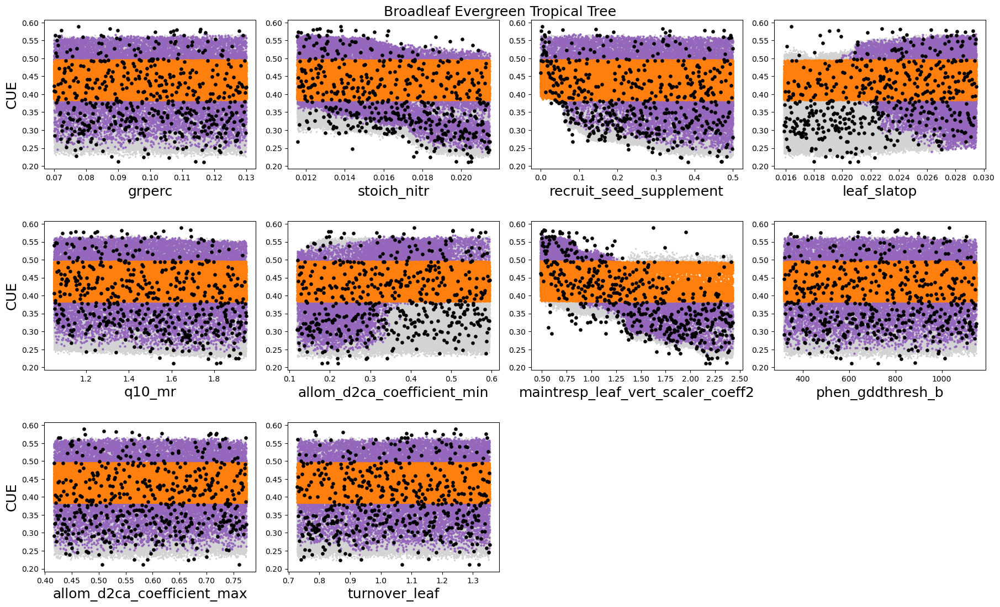

ip 0 0
limxmn 0.6502953171730042 3.258190155029297
ypred 0.2935114160180092 7.489671158790588
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_LAI_p0.png


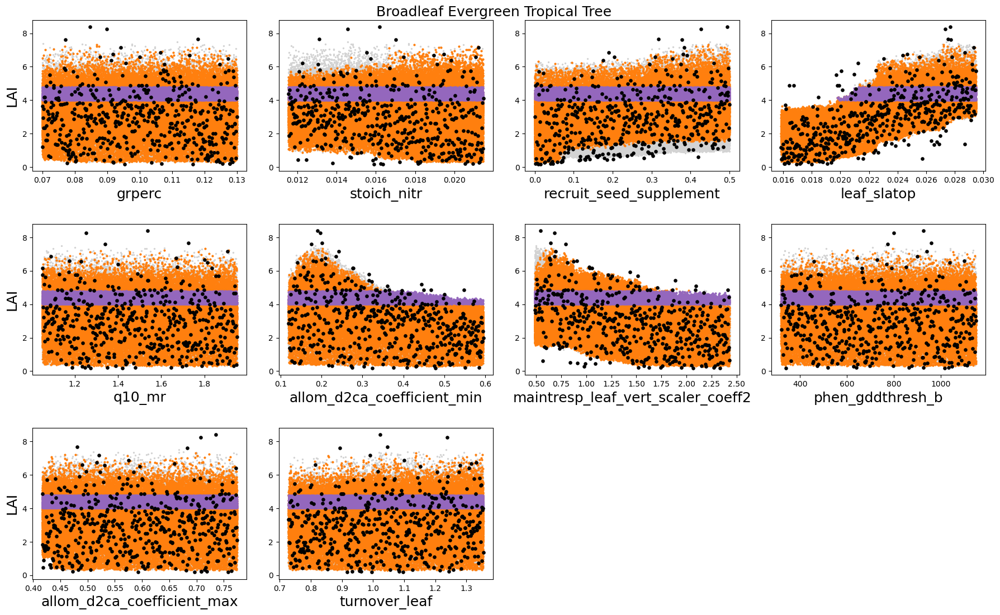

ip 0 0
limxmn 0.6502953171730042 2.6399529198215532
ypred 0.4353193947766627 2.843316115204061
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_GPP_p0.png


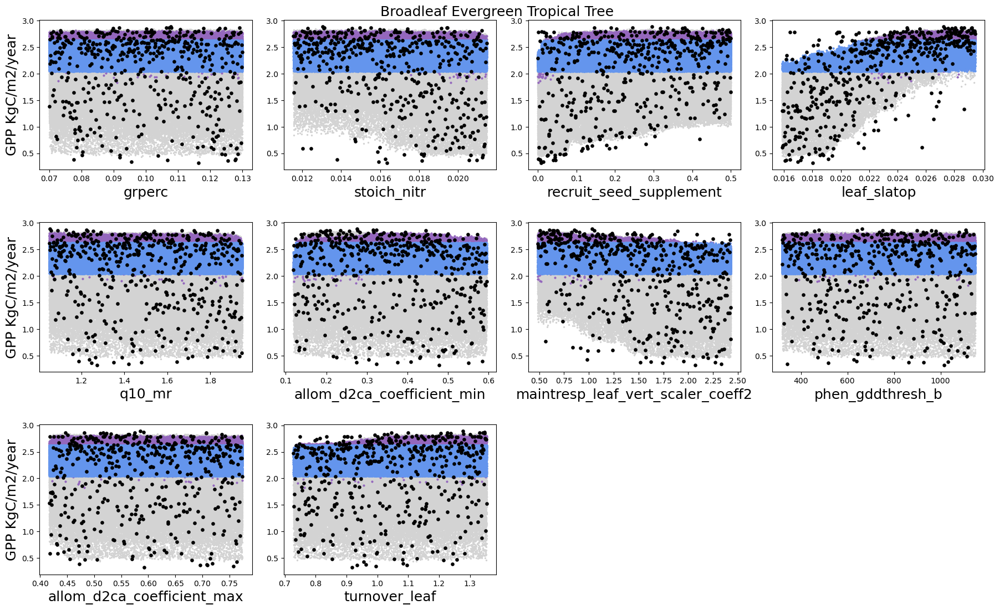

ip 1 1
limxmn 0.6502953171730042 0.7544249296188354
ypred 0.2969082322716713 0.6230895173549652
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_CUE_p1.png


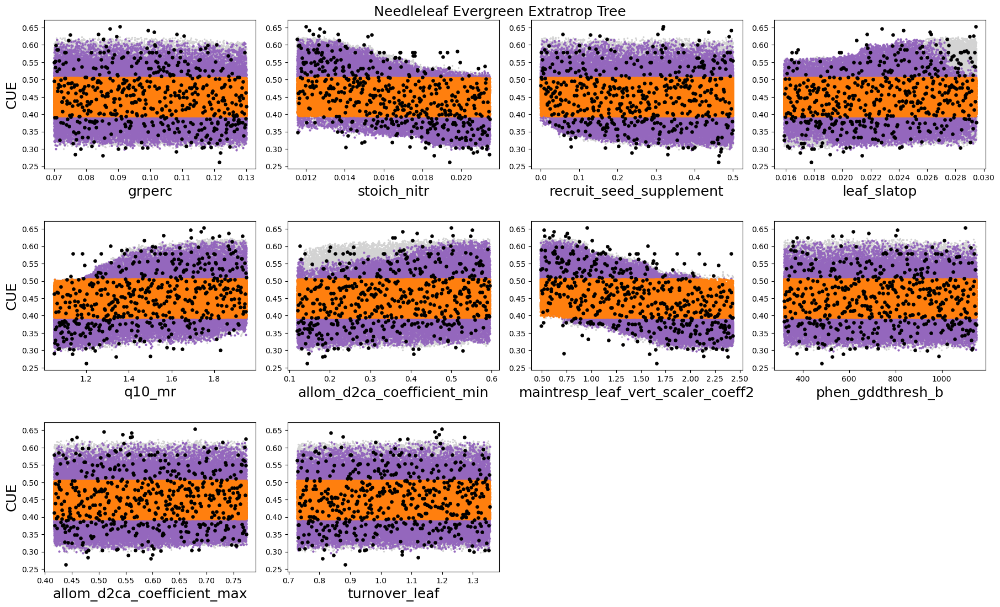

ip 1 1
limxmn 0.6502953171730042 3.258190155029297
ypred 0.3596266812086105 4.191297264099121
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_LAI_p1.png


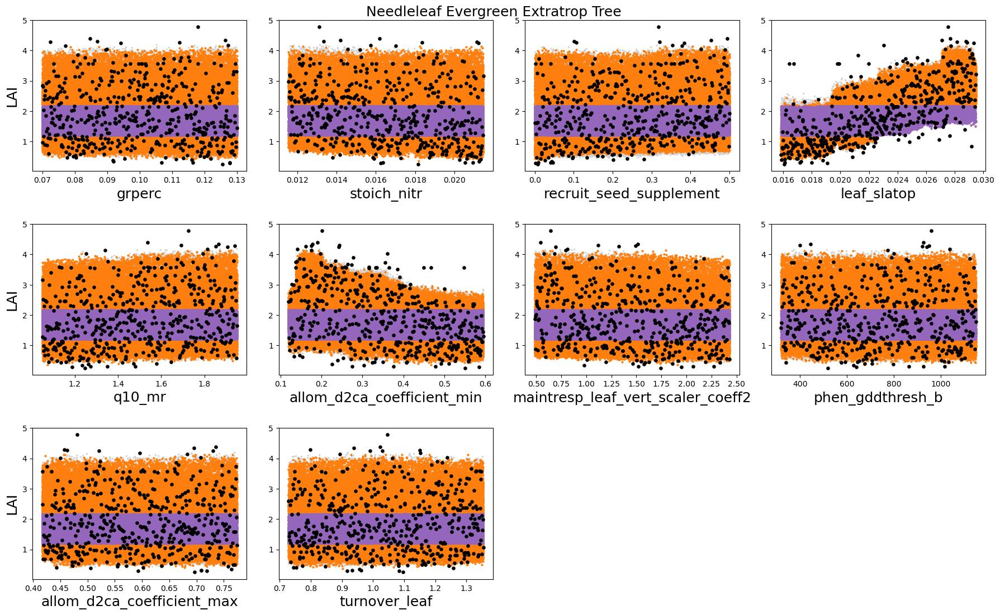

ip 1 1
limxmn 0.6502953171730042 2.6399529198215532
ypred 0.33257038581881737 1.6543826135775532
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_GPP_p1.png


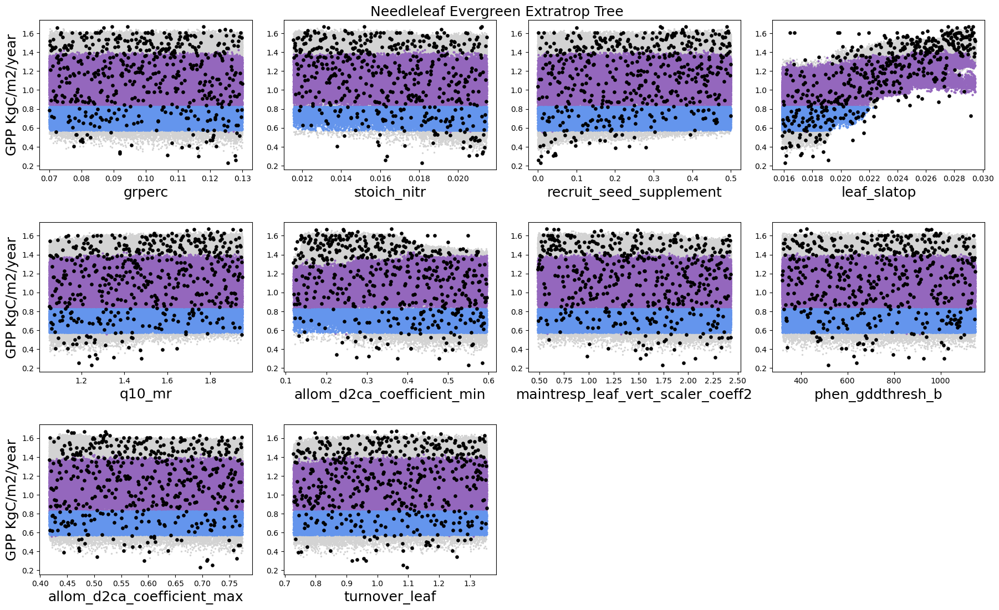

ip 2 2
limxmn 0.6502953171730042 0.7544249296188354
ypred 0.3400486022233963 0.7064899969100952
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_CUE_p2.png


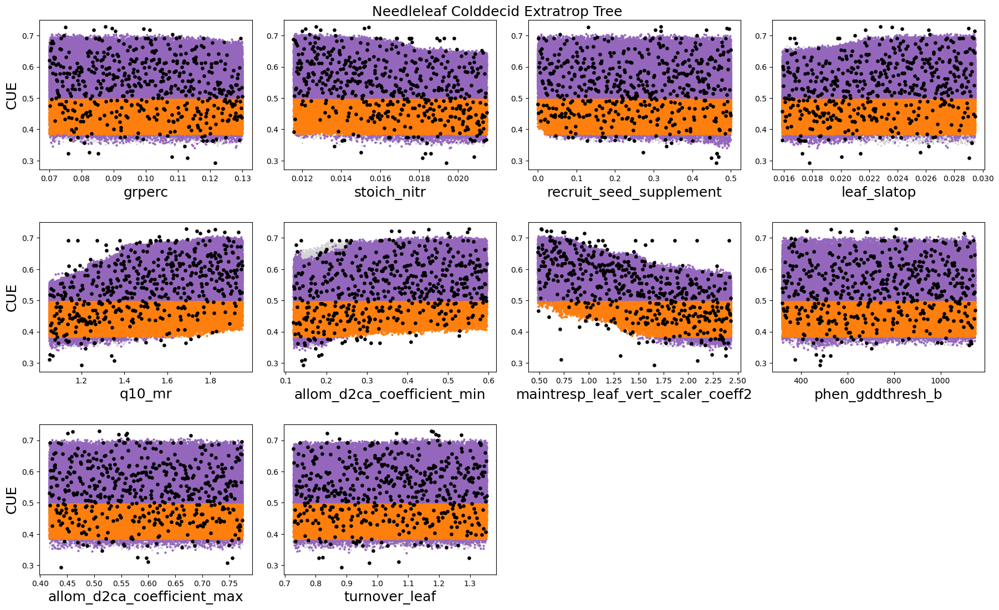

ip 2 2
limxmn 0.6502953171730042 3.258190155029297
ypred 0.4992481169104576 2.716163374185562
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_LAI_p2.png


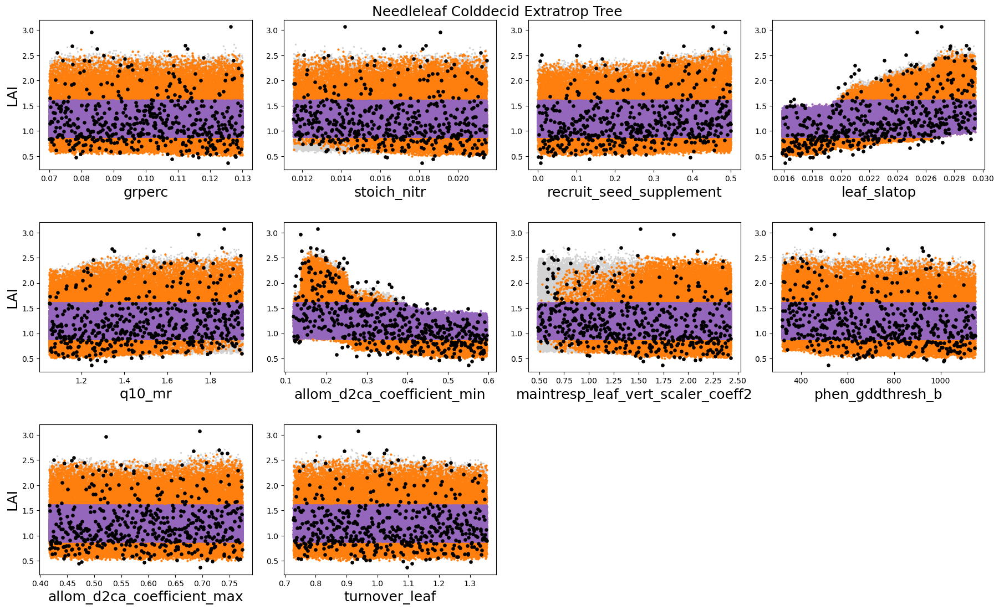

ip 2 2
limxmn 0.6502953171730042 2.6399529198215532
ypred 0.4923474517940818 0.8836670749604991
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_GPP_p2.png


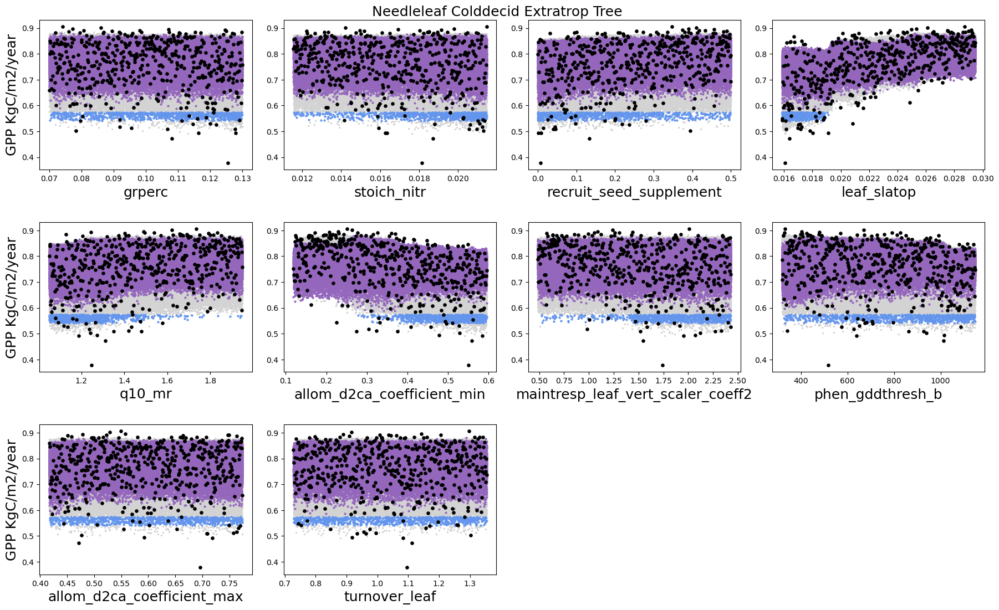

ip 3 9
limxmn 0.6502953171730042 0.7544249296188354
ypred 0.11611898776143789 0.7386262452602387
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_CUE_p9.png


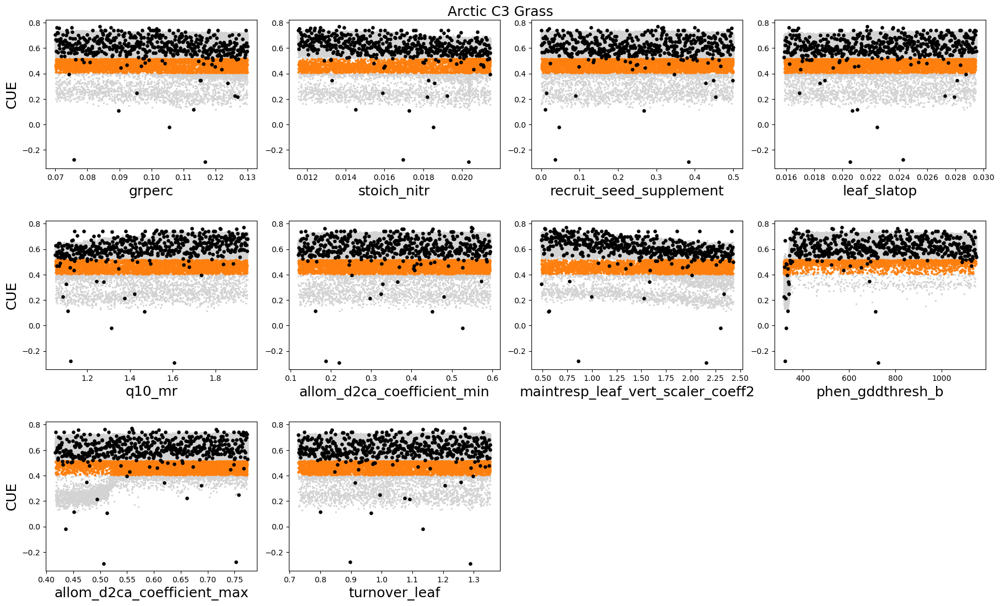

ip 3 9
limxmn 0.6502953171730042 3.258190155029297
ypred 0.9442006415128708 1.656408849954605
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_LAI_p9.png


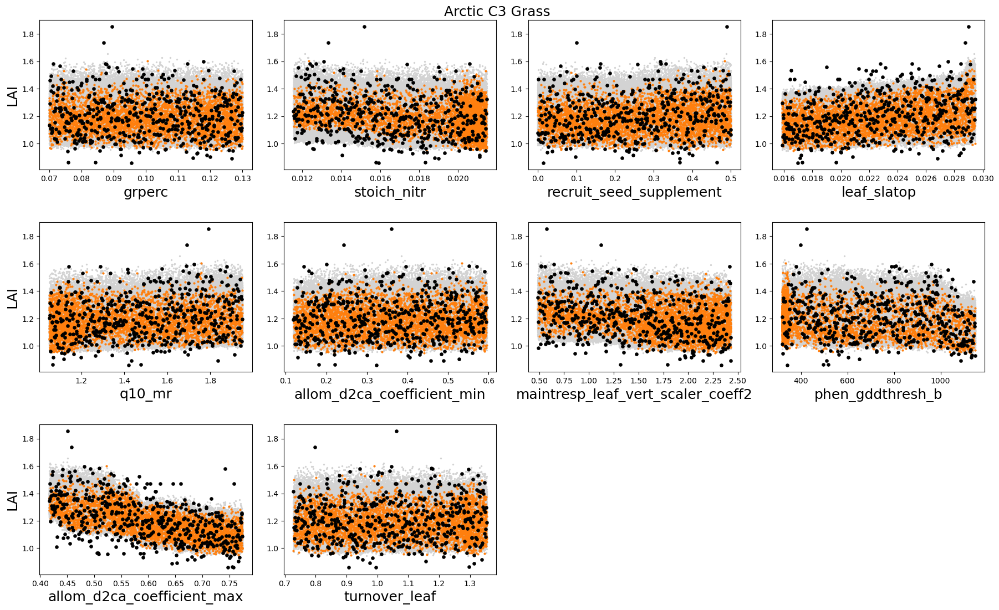

ip 3 9
limxmn 0.6502953171730042 2.6399529198215532
ypred 0.7799572339437633 1.0785526865814488
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_GPP_p9.png


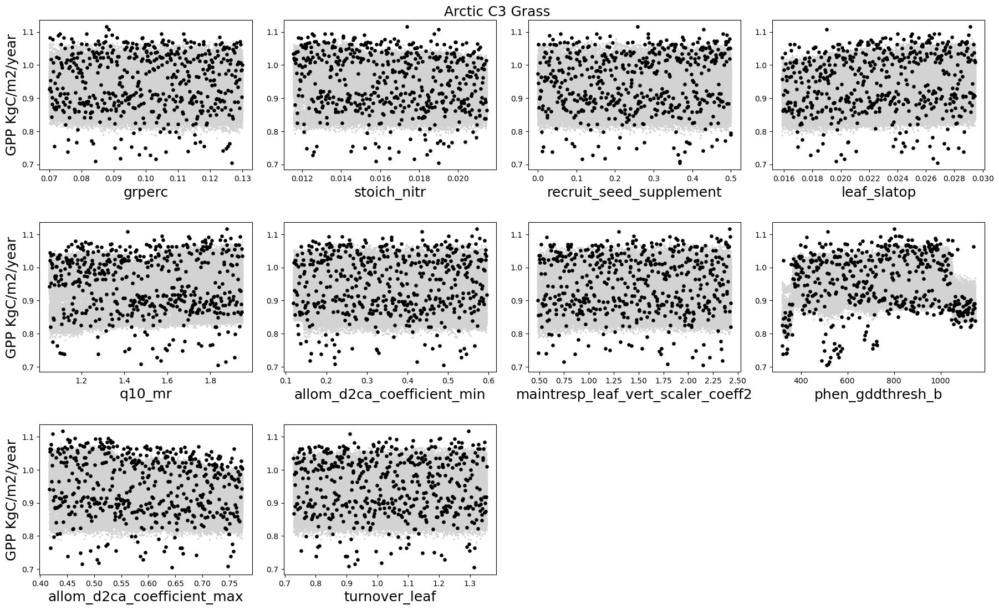

ip 4 10
limxmn 0.6502953171730042 0.7544249296188354
ypred 0.41645668387413026 0.6751181823015213
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_CUE_p10.png


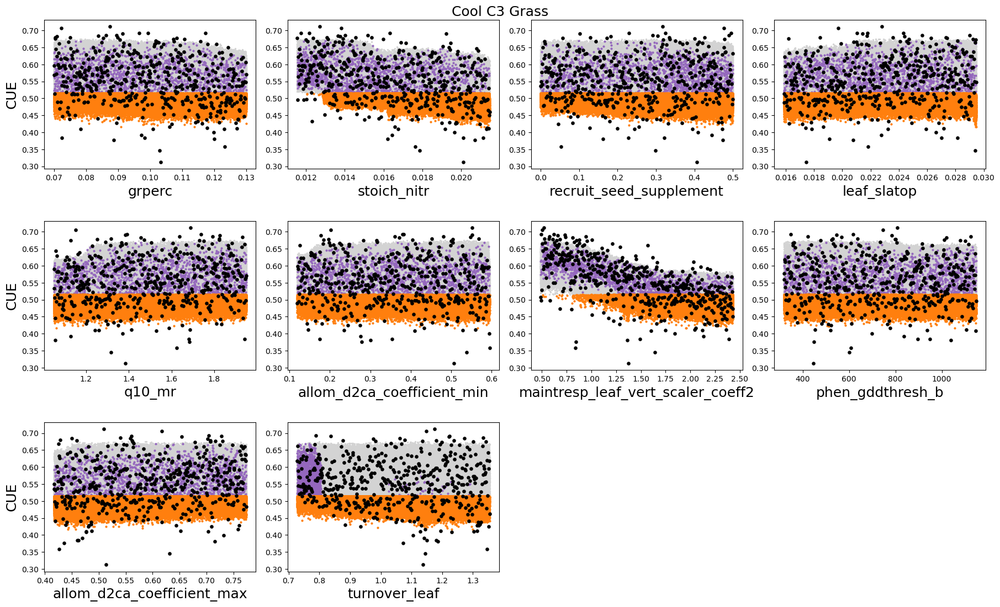

ip 4 10
limxmn 0.6502953171730042 3.258190155029297
ypred 0.27779288694262505 2.016474416255951
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_LAI_p10.png


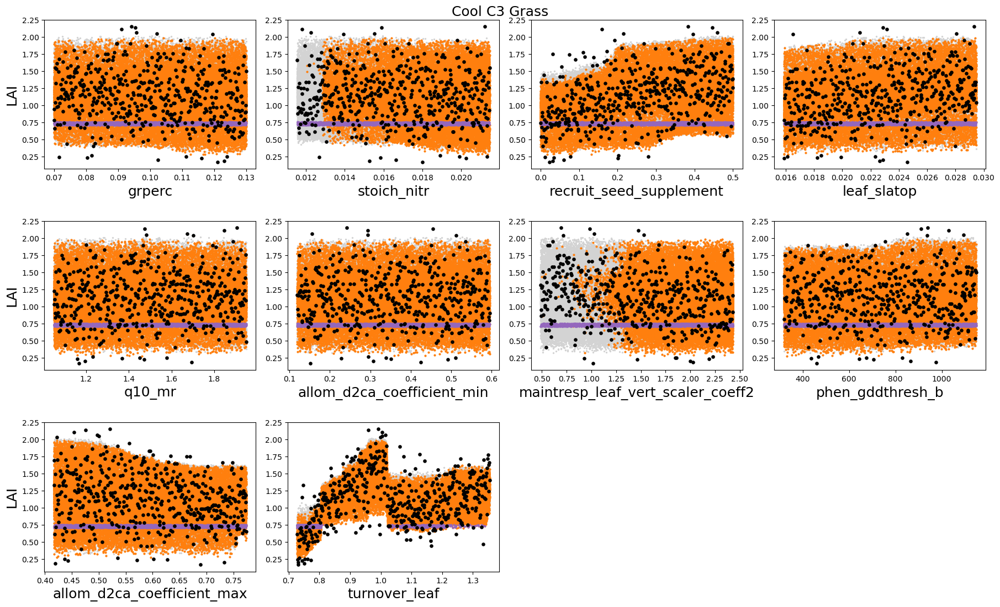

ip 4 10
limxmn 0.6502953171730042 2.6399529198215532
ypred 0.3031949404606505 1.3423386719221853
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_GPP_p10.png


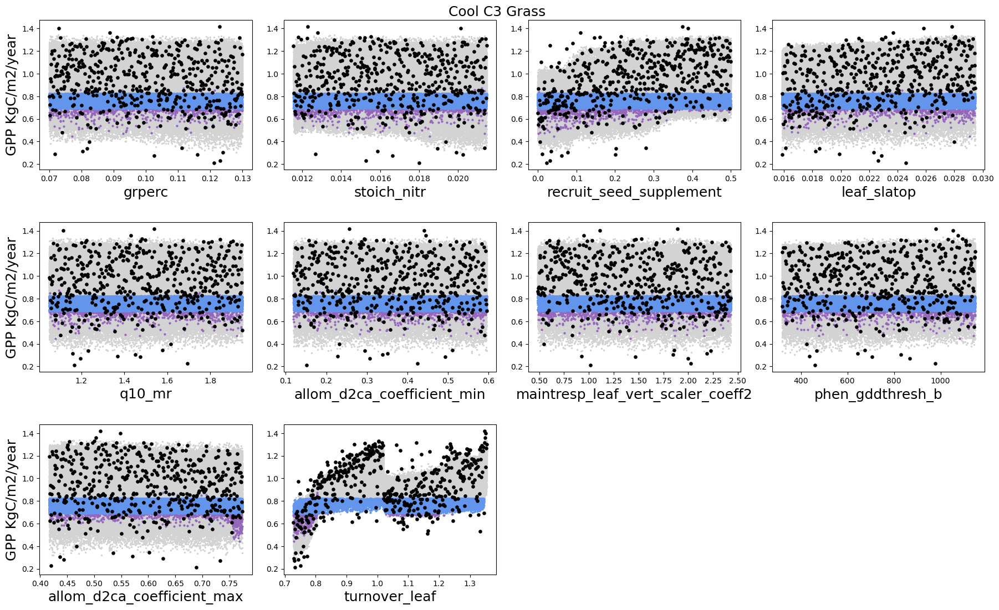

ip 5 11
limxmn 0.6502953171730042 0.7544249296188354
ypred 0.39469467610120773 0.6824344980716706
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_CUE_p11.png


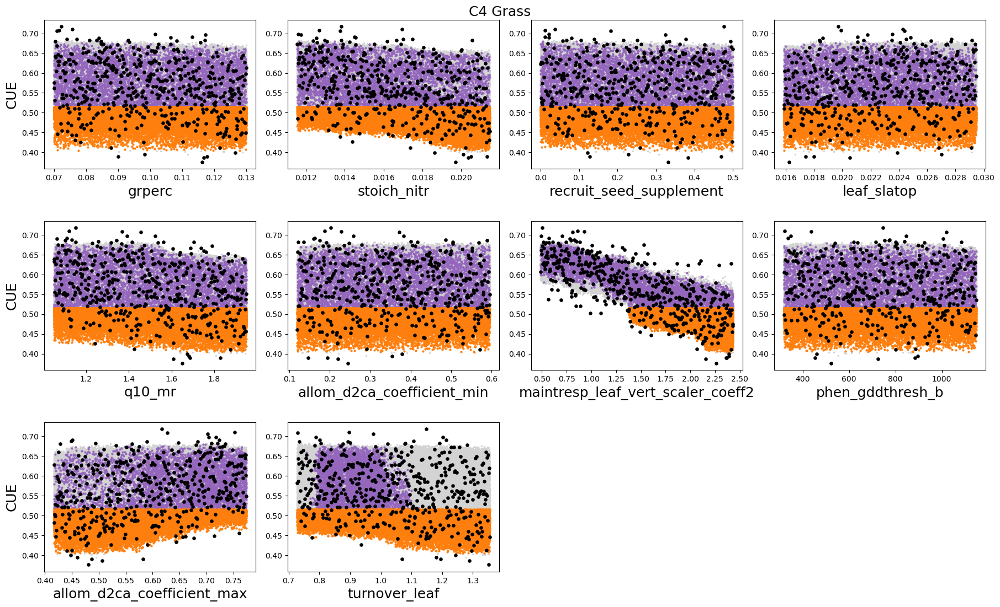

ip 5 11
limxmn 0.6502953171730042 3.258190155029297
ypred 0.8937017899751664 2.412040170431137
/glade/u/home/rfisher/rosiefork_fates_global_cal/rosie_ppe/gaussian_emulator/figs_FATES_NOCOMP_FBG_PPE_LHC10_//emulator_and_ensemble_10_LAI_p11.png


In [ ]:
from matplotlib.colors import CSS4_COLORS

colors = plt.get_cmap('tab10').colors
# Choosing a specific color from the CSS4_COLORS dictionary
chosen_color_all = CSS4_COLORS['lightgrey']  # Selecting the 'lightblue' color from the CSS4_COLORS dictionary
chosen_color_cue = CSS4_COLORS['goldenrod']  # Selecting the 'lightblue' color from the CSS4_COLORS dictionary
chosen_color_lai = CSS4_COLORS['darkcyan']  # Selecting the 'lightblue' color from the CSS4_COLORS dictionary
chosen_color_ens = CSS4_COLORS['darkblue']  # Selecting the 'lightblue' color from the CSS4_COLORS dictionary
chosen_color_gpp = CSS4_COLORS['cornflowerblue']  # Selecting the 'lightblue' color from the CSS4_COLORS dictionary

#chosen_color_all = colors[0]  # Selecting the 'lightblue' color from the CSS4_COLORS dictionary
chosen_color_cue = colors[1]   # Selecting the 'lightblue' color from the CSS4_COLORS dictionary
chosen_color_lai = colors[4]   # Selecting the 'lightblue' color from the CSS4_COLORS dictionary
chosen_color_ens = colors[5]  # Selecting the 'lightblue' color from the CSS4_COLORS dictionary

if pftfit==1:
    for i in range(len(pfts)):
        for vtoggle in [0,1,2]:
            p = pfts[i]
            gcells=gcells_pft[p]
            print('ip',i,p)
            draw_selected_param_space(i,p,pftfit,vtoggle)   
    
            figname=figdir+'/emulator_and_ensemble_'+str(ensN)+'_'+vars_bm[vtoggle]+'_p'+str(p)+'.png'
            print(figname)
            plt.savefig(figname, bbox_inches='tight')
            plt.show() 
else:
    for i in range(len(gcells_pft[p])):
        g=gcells[i] 
        print(g,i)
        draw_selected_param_space(g,i,pftfit)

### Plot out simple parameter distributions

In [ ]:
i=0
accept_lai=accept_lai_i[i]
accept_cue=accept_cue_i[i]   
common_values = np.intersect1d(accept_lai, accept_cue)
print(np.shape(common_values))
p=0
xv=feat_importance[p,0,1]
xsl=np.squeeze( Xdense[accept_lai,xv])
xsc=np.squeeze( Xdense[accept_cue,xv])
xscv=np.squeeze( Xdense[common_values,xv])

print(np.shape(xsl))
plt.hist(xsc,color='blue')
plt.hist(xsl,color='red')
plt.hist(xscv,color='black')
print(np.max(xsl),np.max(xsc),np.max(xscv))

### Make function to plot 3D space

In [ ]:
def plot_3d_param_space(i,g,axes,row,col,v,ch):
    accept_lai=accept_lai_i[i]
    accept_cue=accept_cue_i[i]   
    common_values = np.intersect1d(accept_lai, accept_cue)
    if(v==2):
        vf=1
    else:
        vf=v
        
    xv=feat_importance[i,0,vf]
    yv=feat_importance[i,1,vf]
    zv=feat_importance[i,2,vf]
    cv=feat_importance[i,3,vf]

    xsl = Xdense[accept_lai,xv]
    ysl = Xdense[accept_lai,yv]
    zsl = Xdense[accept_lai,zv]
    csl = Xdense[accept_lai,cv]
    
    xsc = Xdense[accept_cue,xv]
    ysc = Xdense[accept_cue,yv]
    zsc = Xdense[accept_cue,zv]
    csc = Xdense[accept_cue,cv]

    xsb = Xdense[common_values,xv]
    ysb = Xdense[common_values,yv]
    zsb = Xdense[common_values,zv]
    csb = Xdense[common_values,cv]

    if(ch==1):
        xsch = Xdense[chosen_values_i[i],xv]
        ysch = Xdense[chosen_values_i[i],yv]
        zsch = Xdense[chosen_values_i[i],zv]
        csch = Xdense[chosen_values_i[i],cv]
    #if np.size(ysb>0):
       # print('max lai,cue,common x',np.max(xsl),np.max(xsc),np.max(xsb))
       # print('max lai,cue,common y',np.max(ysl),np.max(ysc),np.max(ysb))
       # print('max lai,cue,common z',np.max(zsl),np.max(zsc),np.max(zsb))
   # if(i==0):
     #   print('blt zvals',np.shape(zsl),np.squeeze(zsl)[1:10])
        
    xsd = Xdense[:,xv]
    ysd = Xdense[:,yv]
    zsd = Xdense[:,zv]

    plt3d=axes[row,col].scatter(xsd, ysd, zsd, s=1,color=chosen_color_all, alpha=0.05)
    if(v==1): # LAI
        plt3d=axes[row,col].scatter(xsl,  ysl,  zsl,  s=8,c=chosen_color_lai, alpha=1,label='LAI constraint')
        if(i==0):
            pltz=axes[row,col].text(0.05,2,0.4,str(np.max(zsl)))#plt3dc=axes[row,col].scatter(xsc,  ysc,  zsc,  s=8,c=chosen_color_cue, alpha=0.7,label='CUE constraint')
    elif v==0:
        plt3d=axes[row,col].scatter(xsc,  ysc,  zsc,  s=8,c=chosen_color_cue, alpha=1,label='CUE constraint')
        #plt3dl=axes[row,col].scatter(xsl,  ysl,  zsl,  s=8,c=chosen_color_lai, alpha=0.7,label='LAI constraint')

    elif v==2:
        plt3d=axes[row,col].scatter(xsb,  ysb,  zsb,  s=8,c='black', alpha=0.7,label='CUE and LAI constraint')
        #plt3dl=axes[row,col].scatter(xsl,  ysl,  zsl,  s=8,c=chosen_color_lai, alpha=0.7,label='LAI constraint')
    if(ch==1):# plot chosen values
        plt3d=axes[row,col].scatter(xsch,  ysch,  zsch,  s=18,c='red', alpha=0.7,label='chosen points')
        
        
    fsa=24
    fst=26
    axes[row,col].set_xlabel(lhc_vars_title[xv],fontsize=fsa,labelpad=12)
    axes[row,col].set_ylabel(lhc_vars_title[yv],fontsize=fsa,labelpad=12)
    axes[row,col].set_zlabel(lhc_vars_title[zv],fontsize=fsa)
    axes[row,col].set_title(pftname,fontsize=fst)   

    return [plt3d]

### Plot the 3D space for each PFT average calibration

In [ ]:

ncls=ncls_pft
rw=int(len(pfts)/ncls)
print(ncls,rw)
for v in [0,1,2]:
    fig, axes = plt.subplots(nrows=rw, ncols=ncls, figsize=(32,27),subplot_kw=dict(projection='3d'))
    plt.subplots_adjust(wspace=0.1, hspace=0.2)
    if(v<2): 
        figv=vars_bm[v]
        if(v==0):
            chosen_color=chosen_color_cue
        else:
            chosen_color=chosen_color_lai           
    else:
        figv='lai_and_cue'
        chosen_color='black'
    if(pftfit==1):
        axcount=0
        for i in range(len(pfts)):      
            p=pfts[i] 
            print(p) 
            pftname=sg_data['pft'].values[p].title()
            row = i //ncls
            col = i % ncls    
            hnd=plot_3d_param_space(i,p, axes, row, col,v,0)
            axcount=axcount+1
            
    legend=axes[ rw-1,ncls-1].legend(handles=hnd,fontsize=30)  # Place the legend in the upper right corner            
    #axes[ rw-1,ncls-1].axis('off')
    for text in legend.get_texts():
        text.set_color(chosen_color)
 #   while axcount < rw*ncls:
 #       row = axcount //ncls
 #       col = axcount %ncls
 #       axes[row, col].remove()
 #       axcount += 1  
    plt.tight_layout()
    plt.savefig(figdir+'/PFT_3D_plot_e'+str(ensN)+'_'+figv+'.png', bbox_inches='tight')
    plt.show()

### Choose some members of the selected parameter space. 

#### Create an array of the common values

In [ ]:
import random 

chosen_values_i =[]
for i in range(len(pfts)):
    p=pfts[i]
    accept_lai=accept_lai_i[i]
    accept_cue=accept_cue_i[i]   
    common_values_p = np.intersect1d(accept_lai, accept_cue)
    if(np.size(common_values) >= 10):
        random_values = random.sample(sorted(common_values), 10)  
    else:
        random_values=[1]
    chosen_values_i.append(random_values)
    print(i,p,chosen_values_i[i])
    #choose ten values at random from the common values



In [ ]:
for v in [2]:
    fig, axes = plt.subplots(nrows=rw, ncols=ncls, figsize=(32,27),subplot_kw=dict(projection='3d'))
    plt.subplots_adjust(wspace=0.1, hspace=0.2)
    if(v<2): 
        figv=vars_bm[v]
        if(v==0):
            chosen_color=chosen_color_cue
        else:
            chosen_color=chosen_color_lai           
    else:
        figv='lai_and_cue'
        chosen_color='black'
    if(pftfit==1):
        axcount=0
        for i in range(len(pfts)):      
            p=pfts[i] 
            print(p) 
            pftname=sg_data['pft'].values[p].title()
            row = i //ncls
            col = i % ncls    
            hnd=plot_3d_param_space(i,p, axes, row, col,v,1)
            axcount=axcount+1            
    plt.tight_layout()
    plt.savefig(figdir+'/PFT_3D_plot_e'+str(ensN)+'_'+figv+'.png', bbox_inches='tight')
    plt.show()

#### Copy an existing parameter files from this ensemble into a new ensemble

In [ ]:
if make_params==1:
    noutput_files=10
    pout= 'parameter_outputs/params_output_v1_'
    i=1 
    pfile1= pfileroot+str(1)+'.nc'
    pfiles=[]
    for f in range(noutput_files):
        newfile = pout+str(ensN)+'_'+str(f)+'.nc'
        pfiles.append(newfile) 
    
    print(pfiles)

### For each ensemble member, loop round parameters and change their values

In [ ]:
if make_params==1:
    pfile1= pfileroot+str(1)+'.nc'
    
    pfile1='../nocomp_parameter_modification_python/intermediate_pfiles/modified_average_file2.nc'
    
    for f in range(noutput_files):
        newfile =pout+str(ensN)+'_'+str(f)+'.nc'
        
        pf=xr.open_dataset(pfile1)
        print('nfile',f)
        for v, var in enumerate(lhc_vars):
            dms=pf[var].dims
            ndms=pf[var].ndim
            for i in range(len(pfts)):
                pft = pfts[i]
                # the variable is a PFT specific value
                # so we need to apply it to eaach PFT
                # but it is defined in the SPACE OF THE 1st PFT (TrEB) 
                nxd=chosen_values_i[i][f] # for each PFT (i) and file (f)
                varnew=Xdense[nxd,v] # Find the p1 parameter corresponding
                
                # decide whether this parameter needs PFT scaling       
                if ndms == 0: # one dimensional variable
                    print('0d var', pft,var,varnew)   
                    # do not alter the 0 dimensional variables!
                    #with PFT specific tuning. 
                else: 
                    #print('1d var', var)           
                    #calculate min and max for this parameter
                    param_min=all_param_data[var].min('ens').values
                    param_max=all_param_data[var].max('ens').values
                    param_min_av=np.mean(param_min) #across PFTs
                    param_max_av=np.mean(param_max)
                    delta_p0=(varnew-param_min_av)/(param_max_av-param_min_av)
                    #print('delta',delta_p0,varnew,param_min_av,param_max_av)
                    # `this is the deviation that the first parameter would have in the 
                    #   hypothetical parameter file consistant with this emulated point
                    # For THIS PFT find define the corrsponding value
                    if( ndms == 1):
                        newvalue_PFT=param_min[pft]+delta_p0*(param_max[pft]-param_min[pft])
                        pf[var][pft]=newvalue_PFT
                        #print('1d var', var,newvalue_PFT) 
                    elif ndms == 2: 
                        #print('2d var', var)  
                        newvalue_PFT=param_min[:,pft]+delta_p0*(param_max[:,pft]-param_min[:,pft])
                        pf[var][:,pft]=newvalue_PFT
            #print('var to modf',var,pf[var].values)
        
        pf.to_netcdf(pfiles[f])
        pf.close()


In [ ]:
#for f in range(noutput_files):
f=1
print(pfiles[f])
pf=xr.open_dataset(pfiles[f])

for v, var in enumerate(lhc_vars):
    print(var,pf[var].values)
